<a href="https://colab.research.google.com/github/BrainConnection/Dynamical_Decoupling_Project/blob/main/4.%20Measurement%20Induced%20Dephasing%20Practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Environment Setting

In [1]:
!pip install qutip
!pip install numpy
!pip install matplotlib
!pip install scipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.8/27.8 MB 46.6 MB/s eta 0:00:00


In [2]:
from qutip import *
import numpy as np
import matplotlib.pyplot as plt
import scipy.interpolate
from scipy.optimize import curve_fit
from numpy.random import uniform

#9. Measurement Induced Dephasing

###1) Hamiltonian & Function Setting

Lab Frame

$H_0 = -\frac{\omega_q}{2}\sigma_z + \omega_r a^\dagger a + g\sigma_x(a+a^\dagger)$

$H_1 = A(t) (\hat{a} + \hat{a}^\dagger) \cos{(\omega_{rd} t)}$

$H_2 = B(t) \sigma_x \cos{(\omega_{qd} t)}$

Rotating Frame

$H_0 = -\frac{\omega_q-\omega_{qd}}{2}\sigma_z + ({\omega_r-\omega_{rd}})a^\dagger a + \chi\sigma_z(a^\dagger a)$

$H_1 = \frac{A(t)}{2} (\hat{a} + \hat{a}^\dagger) $

$H_2 = \frac{B(t)}{2}  \sigma_x $

In [ ]:
# operator
N = 100

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

In [ ]:
sz = sigmaz()
sx = sigmax()
sy = sigmay()

sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()

a = destroy(N)

In [ ]:
sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
sm_composite = tensor(sm, qeye(N))

annihilate_composite = tensor(qeye(2), a)
create_composite = tensor(qeye(2), a.dag())
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, sm_composite, annihilate_composite, create_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [ ]:
H0 = -0.5*(omega_q-omega_rd)*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sx, a + a.dag())

H1 = 0.5*tensor(qeye(2), a + a.dag())

H2_x = 0.5*sx_composite

In [ ]:
# single pi & half pi square pulse for drive

def Pi_Square(t, args, T_cent):

    A = args['A']

    return A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

def Half_Pi_Square(t, args, T_cent):

    A = args['A']

    return 0.5 * A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

In [ ]:
# time-dependent envelope for drive

def Hrd_env(Env, Is_Pi):

  if (Env==0 and Is_Pi==0):
    return Half_Pi_Square

  elif (Env==0 and Is_Pi==1):
    return Pi_Square

# time-dependent function for drive

def Hrd_rot(f, t, args, T_cent):

    Omega_rd = args['Omega_rd']
    Phi = args['Phi']

    return f(t, args, T_cent) * np.cos(Omega_rd * t + Phi)

In [ ]:
# Modulate each pulse timing
# pulse list
# pi/2 pulse at T_srt, T_end
# pi pulse at pulse time list

def Pulse_Timing(T_srt, T_end, N, Func):

    T = T_end - T_srt

    Seq_list = []

    if (Func==2) :
      shift = 0
      for i in range(N):
        shift = shift + T * np.sin(np.pi/(2*(N+2))) * np.sin(np.pi*(i+1)/(N+2)) / np.cos(np.pi/(2*(N+2)))
        Seq_list.append(T_srt + shift)

    else :
      for i in range(N):
        Seq_list.append(T_srt + (2*i+1)*T/(2*N))

    Seq = np.array(Seq_list)

    return Seq

In [ ]:
# time-dependent envelope for qubit drive (rotating frame)

# args

# A (amplitude)
# Omega_rd (frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N (number of pulse)
# Env (0: square envelope, 1: cosine envelope, 2: gaussian envelope)
# Func (0: CP, 1: CPMG, 2: UDD)

def Hqd_rotating_frame(t, args):

    T_srt = args['T_srt']
    T_end = args['T_end']
    N = args['N_seq']
    Env = args['Env']
    Func = args['Func']

    B = args['B']


    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, N, Func)


    f = Hrd_env(Env, 0)
    pulse = f(t, {'A': B}, T_srt)

    for T_cent in Seq:
      f = Hrd_env(Env, 1)
      pulse = pulse + f(t, {'A': B}, T_cent)

    f = Hrd_env(Env, 0)
    pulse = pulse + f(t, {'A': B}, T_end)

    return pulse

In [ ]:
# time-dependent coefficient for resonator drive

def Hrd_rotating_frame(t, args):
    """
    Envelope function for the readout drive
    """
    A = args['A'] # amplitude of the readout drive
    T_srt = args['T_srt'] # duration of the readout drive, in units of ns
    T_end = args['T_end'] # duration of the readout drive, in units of ns

    return A * (T_srt <= t) * (t <= T_end)

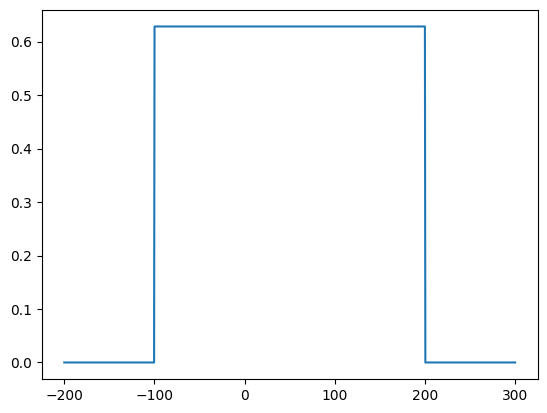

In [ ]:
# resonator pulse simulation (rotating frame)
tlist = np.linspace(-200, 300, 1000)
plt.figure()
plt.plot(tlist, Hrd_rotating_frame(tlist, {'A': 2*np.pi*0.1, 'T_srt': -100, 'T_end': 200}))

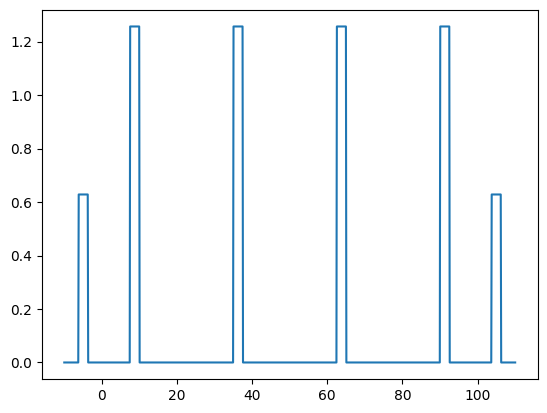

In [ ]:
# qubit pulse simulation (rotating frame)
tlist = np.linspace(-10, 110, 1000)
plt.figure()
plt.plot(tlist, Hqd_rotating_frame(tlist, {'B': 2*np.pi*0.2, 'T_srt': -5, 'T_end': 105, 'N_seq': 4, 'Env': 0, 'Func': 0}))

### 2) Coupling Constant, Detune Sweeping

kappa = 2 * np.pi * 0.01

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.9 # qubit frequency in units of GHz
g = 2 * np.pi * 0.0001        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz
kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [ ]:
plus_list = []
alpha_list = []
n_list = []

result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*0.01, 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
)

plus_list = result.expect[3]
n_list = result.expect[5]

/usr/local/lib/python3.10/dist-packages/qutip/solver/options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'Off Diagonal Term Expectation Value')

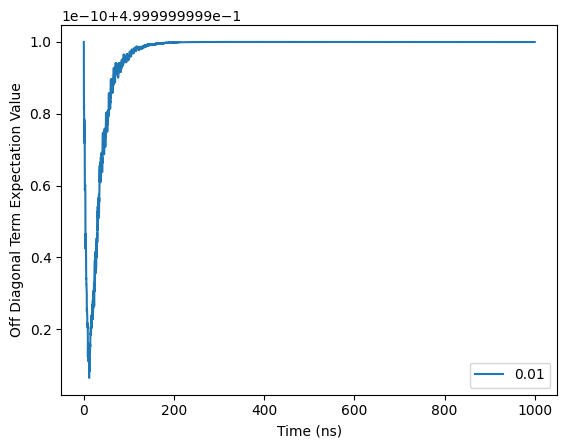

In [ ]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(1):
  ax.plot(tlist, plus_list, label = '0.01')

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

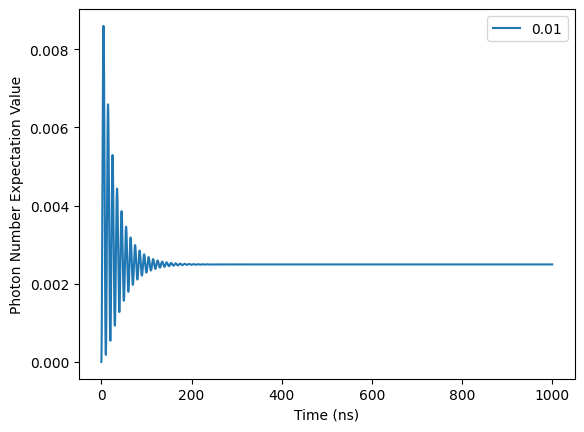

In [ ]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(1):
  ax.plot(tlist, n_list, label = '0.01')

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

#### g=0.1GHz Sweeping

In [ ]:
N = 5

plus_tot_0 = []
n_tot_0 = []
freq_0 = []
rel_intensity_0 = []

for unit in range(30):

  detune = 0.01*unit

  omega_r = 2 * np.pi * 7.0           # resonator frequency in units of GHz
  omega_q = 2 * np.pi * 6.0           # qubit frequency in units of GHz
  omega_rd = 2 * np.pi * (7.0-detune) # qubit frequency in units of GHz
  g = 2 * np.pi * 0.1                 # qubit-resonator coupling in units of GHz
  kappa = 2 * np.pi * 0.01            # external coupling rate of resonator in units of GHz

  sz = sigmaz()
  sx = sigmax()
  sy = sigmay()
  sp = basis(2,1)*basis(2,0).dag()
  a = destroy(N)


  sp_composite = tensor(sp, qeye(N))
  number_composite = tensor(qeye(2), a.dag()*a)
  op_list = [sp_composite, number_composite]

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  tlist = np.linspace(0, 1000, 10000)

  plus_list = []
  n_list = []

  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*0.01, 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list = result.expect[0]
  n_list = result.expect[1]

  n_fft = np.fft.fftshift(np.fft.fft(n_list))
  n_freq = np.fft.fftshift(np.fft.fftfreq(len(n_fft), d=tlist[1]-tlist[0]))

  peaks, _ = find_peaks(np.abs(n_fft), height=0)

  peak_freq = []
  peak_intensity = []

  for i in range(np.size(peaks)):
    if peaks[i] > 5000:
      n = peaks[i]
      peak_freq.append(n_freq[n])
      peak_intensity.append(np.abs(n_fft[n])/np.abs(n_fft[5000]))

  plus_tot_0.append(2*np.abs(plus_list[-1]))
  n_tot_0.append(2*np.abs(n_list[-1]))

  if len(peak_freq)==0:
    freq_0.append(0)

  else: freq_0.append(peak_freq[0])

  if len(peak_intensity)==0:
    rel_intensity_0.append(0)

  else: rel_intensity_0.append(peak_intensity[0])



/usr/local/lib/python3.10/dist-packages/qutip/solver/options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


ValueError: QobjEvo term [Quantum object: dims=[[2, 100], [2, 100]], shape=(200, 200), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], <function Hqd_rotating_frame at 0x7fc150198670>] has dims [[2, 100], [2, 100]] and shape (200, 200) but previous terms had dims [[2, 5], [2, 5]] and shape (10, 10).

In [ ]:
plt.figure()
plt.plot([0.01*i for i in range(30)], plus_tot_0, label="g=0.1")
plt.xlabel('Resonator-Drive Pulse Detune')
plt.ylabel('Decoherence')

In [ ]:
plt.figure()
plt.plot([0.01*i for i in range(30)], n_tot_0, label="g=0.1")
plt.xlabel('Resonator-Drive Pulse Detune')
plt.ylabel('Photon Number n')

In [ ]:
plt.figure()
plt.plot([0.01*i for i in range(30)], freq_0, label="g=0.1")
plt.xlabel('Resonator-Drive Pulse Detune')
plt.ylabel('Frequency Pick')

In [ ]:
plt.figure()
plt.plot([0.01*i for i in range(30)], rel_intensity_0, label="g=0.1")
plt.xlabel('Resonator-Drive Pulse Detune')
plt.ylabel('Frequency Pick')

#### g=0.03GHz Sweeping

In [ ]:
N = 5

plus_tot_1 = []
n_tot_1 = []
freq_1 = []
rel_intensity_1 = []

for unit in range(30):

  detune = 0.01*unit

  omega_r = 2 * np.pi * 7.0           # resonator frequency in units of GHz
  omega_q = 2 * np.pi * 6.0           # qubit frequency in units of GHz
  omega_rd = 2 * np.pi * (7.0-detune) # qubit frequency in units of GHz
  g = 2 * np.pi * 0.03                 # qubit-resonator coupling in units of GHz
  kappa = 2 * np.pi * 0.01            # external coupling rate of resonator in units of GHz

  sz = sigmaz()
  sx = sigmax()
  sy = sigmay()
  sp = basis(2,1)*basis(2,0).dag()
  a = destroy(N)


  sp_composite = tensor(sp, qeye(N))
  number_composite = tensor(qeye(2), a.dag()*a)
  op_list = [sp_composite, number_composite]

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  tlist = np.linspace(0, 1000, 10000)

  plus_list = []
  n_list = []

  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*0.01, 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list = result.expect[0]
  n_list = result.expect[1]

  n_fft = np.fft.fftshift(np.fft.fft(n_list))
  n_freq = np.fft.fftshift(np.fft.fftfreq(len(n_fft), d=tlist[1]-tlist[0]))

  peaks, _ = find_peaks(np.abs(n_fft), height=0)

  peak_freq = []
  peak_intensity = []

  for i in range(np.size(peaks)):
    if peaks[i] > 5000:
      n = peaks[i]
      peak_freq.append(n_freq[n])
      peak_intensity.append(np.abs(n_fft[n])/np.abs(n_fft[5000]))

  plus_tot_1.append(2*np.abs(plus_list[-1]))
  n_tot_1.append(2*np.abs(n_list[-1]))

  if len(peak_freq)==0:
    freq_1.append(0)

  else: freq_1.append(peak_freq[0])

  if len(peak_intensity)==0:
    rel_intensity_1.append(0)

  else: rel_intensity_1.append(peak_intensity[0])



ValueError: QobjEvo term [Quantum object: dims=[[2, 100], [2, 100]], shape=(200, 200), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], <function Hqd_rotating_frame at 0x7fc150198670>] has dims [[2, 100], [2, 100]] and shape (200, 200) but previous terms had dims [[2, 5], [2, 5]] and shape (10, 10).

In [ ]:
plt.figure()
plt.plot([0.01*i for i in range(30)], plus_tot_1, label="g=0.03")
plt.xlabel('Resonator-Drive Pulse Detune')
plt.ylabel('Decoherence')

In [ ]:
plt.figure()
plt.plot([0.01*i for i in range(30)], n_tot_1, label="g=0.03")
plt.xlabel('Resonator-Drive Pulse Detune')
plt.ylabel('Photon Number n')

In [ ]:
plt.figure()
plt.plot([0.01*i for i in range(30)], freq_1, label="g=0.03")
plt.xlabel('Resonator-Drive Pulse Detune')
plt.ylabel('Frequency Pick')

In [ ]:
plt.figure()
plt.plot([0.01*i for i in range(30)], rel_intensity_1, label="g=0.03")
plt.xlabel('Resonator-Drive Pulse Detune')
plt.ylabel('Frequency Pick')

#### Comparing different g

Text(0, 0.5, 'Decoherence')

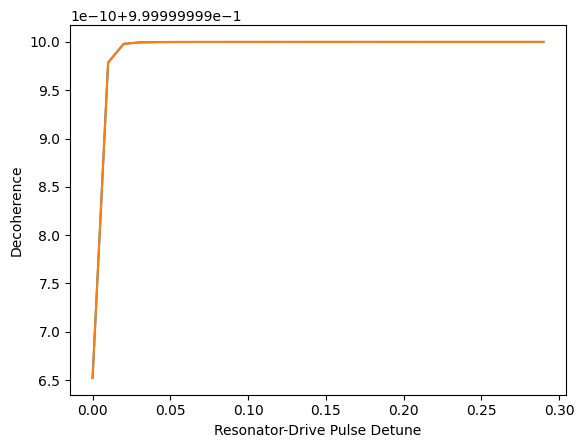

In [ ]:
plt.figure()
plt.plot([0.01*i for i in range(30)], plus_tot_0, label="g=0.1")
plt.plot([0.01*i for i in range(30)], plus_tot_1, label="g=0.03")
plt.xlabel('Resonator-Drive Pulse Detune')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Photon Number n')

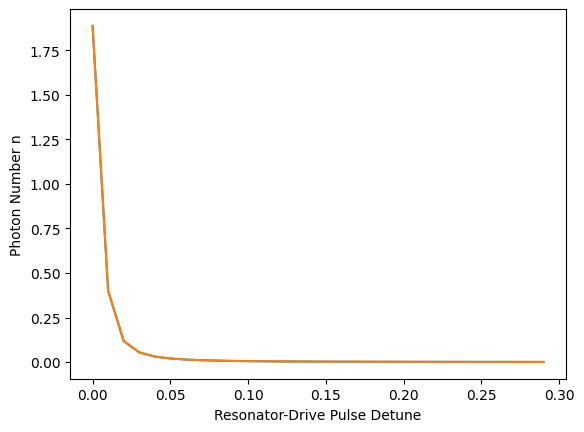

In [ ]:
plt.figure()
plt.plot([0.01*i for i in range(30)], n_tot_0, label="g=0.1")
plt.plot([0.01*i for i in range(30)], n_tot_1, label="g=0.03")
plt.xlabel('Resonator-Drive Pulse Detune')
plt.ylabel('Photon Number n')

# 10. Measurement Induced Dephasing Dynamical Decoupling

## 1) Filtering Function (μs, MHz scale)

In [3]:
omega_list = np.linspace(0,10,10000)

def filter(omega_list, tau, N):

  if N==0:
    f = (4*np.sin(2*np.pi*tau*omega_list/2)*np.sin(2*np.pi*tau*omega_list/2))/(2*np.pi*2*np.pi*omega_list**2)
    return f

  elif N==1:
    f = ((4*np.sin(2*np.pi*tau*omega_list/4)*np.sin(2*np.pi*tau*omega_list/4))/(2*np.pi*omega_list))**2
    return f

  else:
    f = (2*np.sin(2*np.pi*tau*omega_list/2)*(np.cos(2*np.pi*tau*omega_list/(2*N))-1)/(2*np.pi*omega_list*np.cos(2*np.pi*tau*omega_list/(2*N))))**2
    return f

<ipython-input-3-09a753571ad5>:6: RuntimeWarning: invalid value encountered in divide
  f = (4*np.sin(2*np.pi*tau*omega_list/2)*np.sin(2*np.pi*tau*omega_list/2))/(2*np.pi*2*np.pi*omega_list**2)
<ipython-input-3-09a753571ad5>:10: RuntimeWarning: invalid value encountered in divide
  f = ((4*np.sin(2*np.pi*tau*omega_list/4)*np.sin(2*np.pi*tau*omega_list/4))/(2*np.pi*omega_list))**2
<ipython-input-3-09a753571ad5>:14: RuntimeWarning: invalid value encountered in divide
  f = (2*np.sin(2*np.pi*tau*omega_list/2)*(np.cos(2*np.pi*tau*omega_list/(2*N))-1)/(2*np.pi*omega_list*np.cos(2*np.pi*tau*omega_list/(2*N))))**2


Text(0, 0.5, 'Filter Function Distribution')

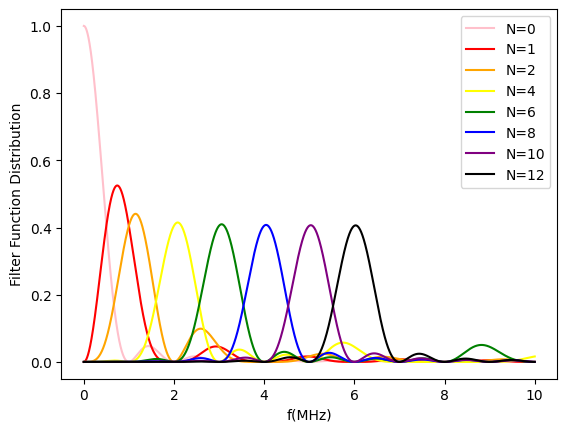

In [4]:
tau = 1

fig, ax = plt.subplots(1, 1)
ax.plot(omega_list, filter(omega_list, tau, 0), label = 'N=0', color='pink')
ax.plot(omega_list, filter(omega_list, tau, 1), label = 'N=1', color='red')
ax.plot(omega_list, filter(omega_list, tau, 2), label = 'N=2', color='orange')
ax.plot(omega_list, filter(omega_list, tau, 4), label = 'N=4', color='yellow')
ax.plot(omega_list, filter(omega_list, tau, 6), label = 'N=6', color='green')
ax.plot(omega_list, filter(omega_list, tau, 8), label = 'N=8', color='blue')
ax.plot(omega_list, filter(omega_list, tau, 10), label = 'N=10', color='purple')
ax.plot(omega_list, filter(omega_list, tau, 12), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('f(MHz)')
ax.set_ylabel('Filter Function Distribution')

<ipython-input-3-09a753571ad5>:6: RuntimeWarning: invalid value encountered in divide
  f = (4*np.sin(2*np.pi*tau*omega_list/2)*np.sin(2*np.pi*tau*omega_list/2))/(2*np.pi*2*np.pi*omega_list**2)
<ipython-input-3-09a753571ad5>:10: RuntimeWarning: invalid value encountered in divide
  f = ((4*np.sin(2*np.pi*tau*omega_list/4)*np.sin(2*np.pi*tau*omega_list/4))/(2*np.pi*omega_list))**2
<ipython-input-3-09a753571ad5>:14: RuntimeWarning: invalid value encountered in divide
  f = (2*np.sin(2*np.pi*tau*omega_list/2)*(np.cos(2*np.pi*tau*omega_list/(2*N))-1)/(2*np.pi*omega_list*np.cos(2*np.pi*tau*omega_list/(2*N))))**2


Text(0, 0.5, 'Filter Function Distribution')

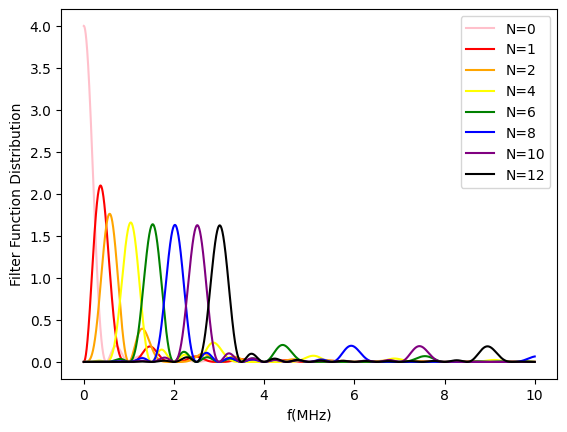

In [5]:
tau = 2

fig, ax = plt.subplots(1, 1)
ax.plot(omega_list, filter(omega_list, tau, 0), label = 'N=0', color='pink')
ax.plot(omega_list, filter(omega_list, tau, 1), label = 'N=1', color='red')
ax.plot(omega_list, filter(omega_list, tau, 2), label = 'N=2', color='orange')
ax.plot(omega_list, filter(omega_list, tau, 4), label = 'N=4', color='yellow')
ax.plot(omega_list, filter(omega_list, tau, 6), label = 'N=6', color='green')
ax.plot(omega_list, filter(omega_list, tau, 8), label = 'N=8', color='blue')
ax.plot(omega_list, filter(omega_list, tau, 10), label = 'N=10', color='purple')
ax.plot(omega_list, filter(omega_list, tau, 12), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('f(MHz)')
ax.set_ylabel('Filter Function Distribution')

In [16]:
def lorentzian(omega_list, kappa, n):
  return n*kappa/((2*np.pi*omega_list)**2 + (kappa/2)**2)

In [17]:
def chi_N(tau, kappa, n, kai, N):
  freq_list = np.linspace(0.01,10000.01,1000000)
  filt = filter(freq_list, tau, N)
  spec = lorentzian(freq_list, kappa, n)
  A = 0
  for i in range(10000):
    A = A + 2*np.pi * 2*kai**2 * filt[i]*spec[i]*0.01

  return A

### $n = 0.01$

$\kappa = 2 \pi 10 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

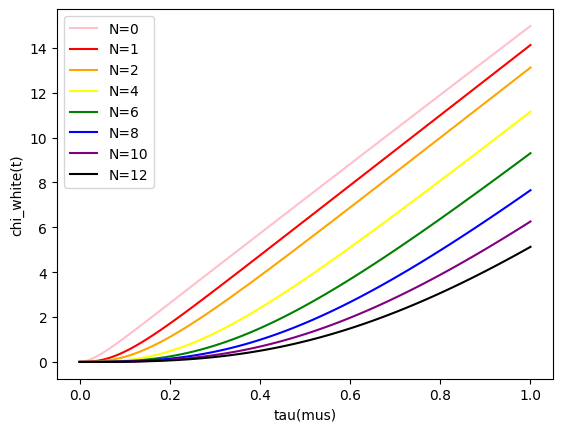

In [21]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 0.01
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

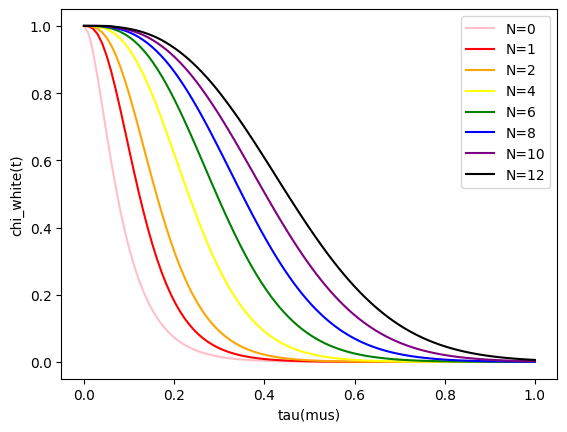

In [19]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 0.01
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

### $n = 0.01$

$\kappa = 2 \pi 3 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

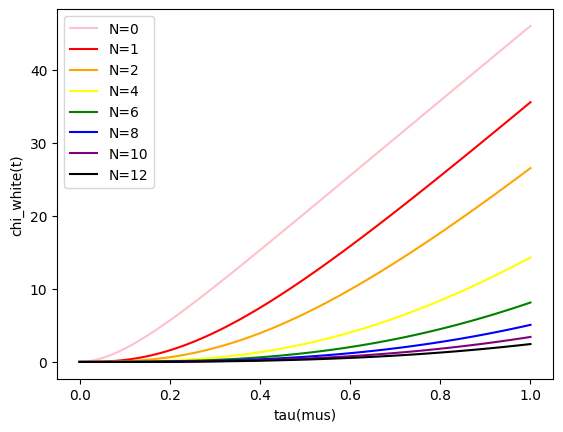

In [22]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 0.01
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

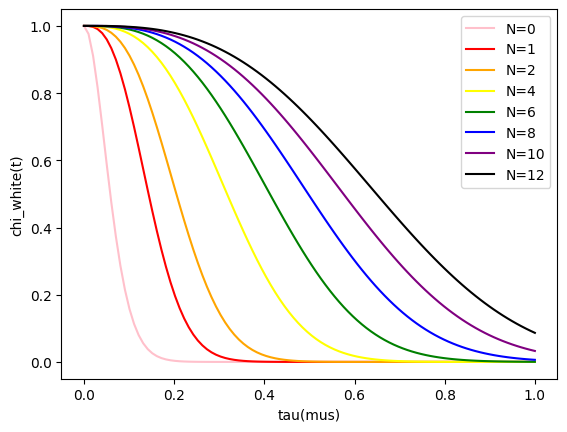

In [23]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 0.01
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

### $n = 0.1$

$\kappa = 2 \pi 10 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

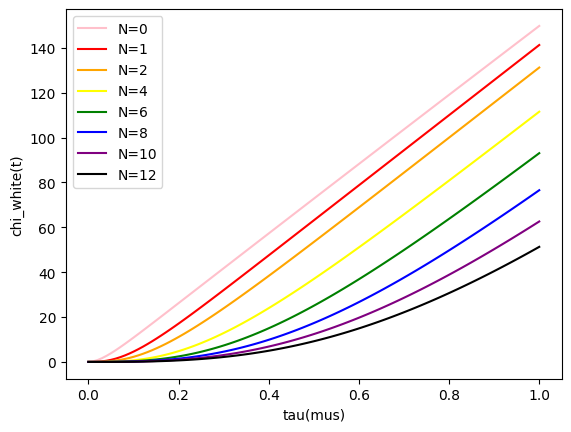

In [24]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 0.1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

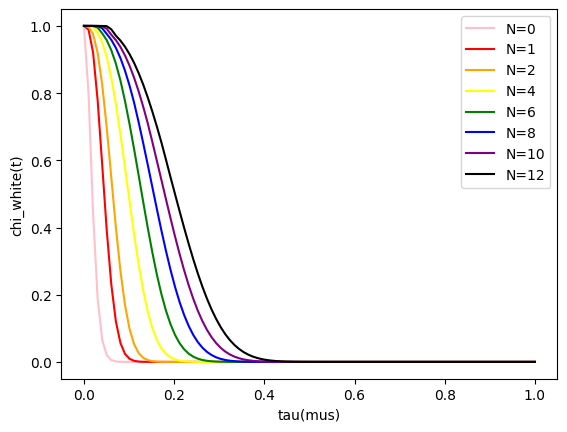

In [25]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 0.1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

### $n = 0.1$

$\kappa = 2 \pi 3 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

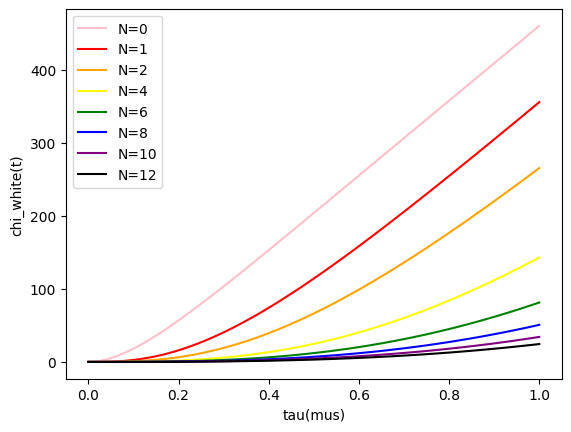

In [26]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 0.1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

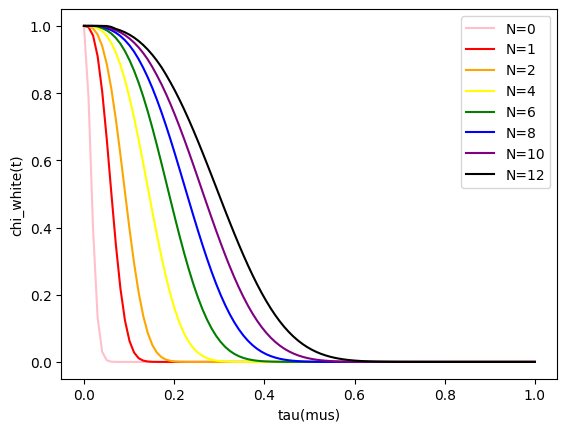

In [27]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 0.1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

### $n = 1$

$\kappa = 2 \pi 10 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

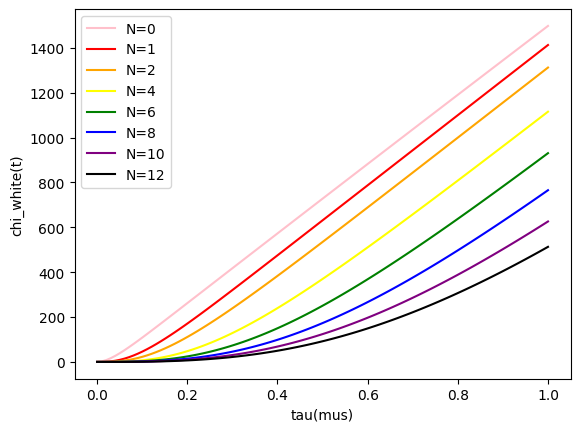

In [28]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

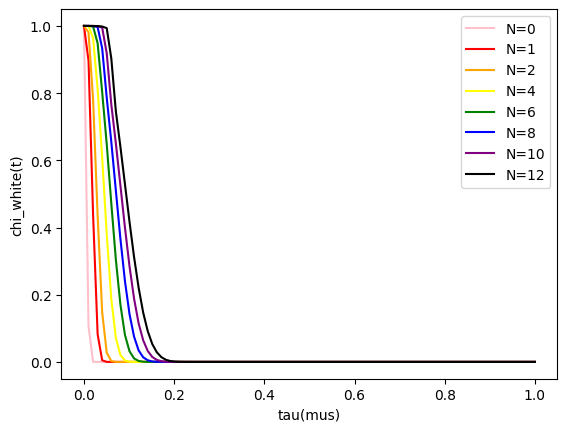

In [29]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

### $n = 1$

$\kappa = 2 \pi 3 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

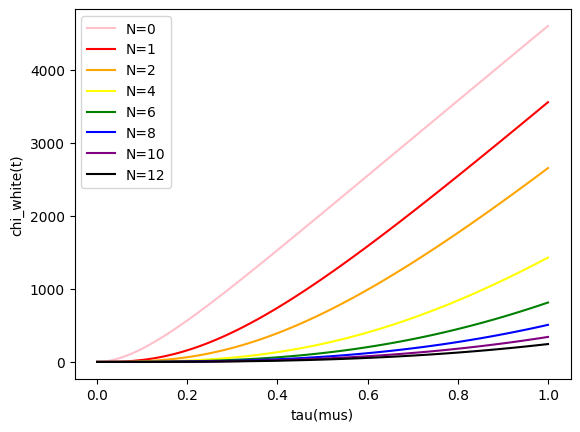

In [30]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

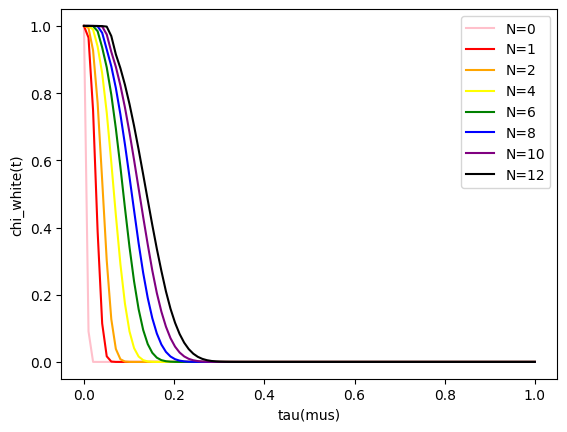

In [31]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

## 2) Hamiltonian & Function Setting

Lab Frame

$H_0 = -\frac{\omega_q}{2}\sigma_z + \omega_r a^\dagger a + g\sigma_x(a+a^\dagger)$

$H_1 = A(t) (\hat{a} + \hat{a}^\dagger) \cos{(\omega_{rd} t)}$

$H_2 = B(t) \sigma_x \cos{(\omega_{qd} t)}$

Rotating Frame

$H_0 = -\frac{\omega_q-\omega_{qd}}{2}\sigma_z + ({\omega_r-\omega_{rd}})a^\dagger a + \chi\sigma_z(a^\dagger a)$

$H_1 = \frac{A(t)}{2} (\hat{a} + \hat{a}^\dagger) $

$H_2 = \frac{B(t)}{2}  \sigma_x $

In [ ]:
# operator
N = 100

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

In [ ]:
sz = sigmaz()
sx = sigmax()
sy = sigmay()

sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()

a = destroy(N)

In [ ]:
sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
sm_composite = tensor(sm, qeye(N))

annihilate_composite = tensor(qeye(2), a)
create_composite = tensor(qeye(2), a.dag())
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, sm_composite, annihilate_composite, create_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [ ]:
H0 = -0.5*(omega_q-omega_rd)*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sx, a + a.dag())

H1 = 0.5*tensor(qeye(2), a + a.dag())

H2_x = 0.5*sx_composite

In [ ]:
# single pi & half pi square pulse for drive

def Pi_Square(t, args, T_cent):

    A = args['A']

    return A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

def Half_Pi_Square(t, args, T_cent):

    A = args['A']

    return 0.5 * A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

In [ ]:
# time-dependent envelope for drive

def Hrd_env(Env, Is_Pi):

  if (Env==0 and Is_Pi==0):
    return Half_Pi_Square

  elif (Env==0 and Is_Pi==1):
    return Pi_Square

# time-dependent function for drive

def Hrd_rot(f, t, args, T_cent):

    Omega_rd = args['Omega_rd']
    Phi = args['Phi']

    return f(t, args, T_cent) * np.cos(Omega_rd * t + Phi)

In [ ]:
# Modulate each pulse timing
# pulse list
# pi/2 pulse at T_srt, T_end
# pi pulse at pulse time list

def Pulse_Timing(T_srt, T_end, N, Func):

    T = T_end - T_srt

    Seq_list = []

    if (Func==2) :
      shift = 0
      for i in range(N):
        shift = shift + T * np.sin(np.pi/(2*(N+2))) * np.sin(np.pi*(i+1)/(N+2)) / np.cos(np.pi/(2*(N+2)))
        Seq_list.append(T_srt + shift)

    else :
      for i in range(N):
        Seq_list.append(T_srt + (2*i+1)*T/(2*N))

    Seq = np.array(Seq_list)

    return Seq

In [ ]:
# time-dependent envelope for qubit drive (rotating frame)

# args

# A (amplitude)
# Omega_rd (frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N (number of pulse)
# Env (0: square envelope, 1: cosine envelope, 2: gaussian envelope)
# Func (0: CP, 1: CPMG, 2: UDD)

def Hqd_rotating_frame(t, args):

    T_srt = args['T_srt']
    T_end = args['T_end']
    N = args['N_seq']
    Env = args['Env']
    Func = args['Func']

    B = args['B']


    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, N, Func)


    f = Hrd_env(Env, 0)
    pulse = f(t, {'A': B}, T_srt)

    for T_cent in Seq:
      f = Hrd_env(Env, 1)
      pulse = pulse + f(t, {'A': B}, T_cent)

    f = Hrd_env(Env, 0)
    pulse = pulse + f(t, {'A': B}, T_end)

    return pulse

In [ ]:
# time-dependent coefficient for resonator drive

def Hrd_rotating_frame(t, args):
    """
    Envelope function for the readout drive
    """
    A = args['A'] # amplitude of the readout drive
    T_srt = args['T_srt'] # duration of the readout drive, in units of ns
    T_end = args['T_end'] # duration of the readout drive, in units of ns

    return A * (T_srt <= t) * (t <= T_end)

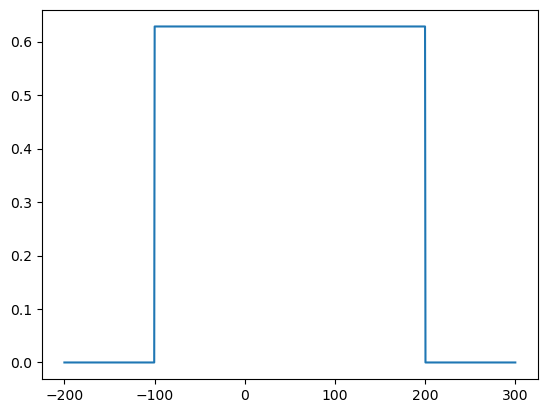

In [ ]:
# resonator pulse simulation (rotating frame)
tlist = np.linspace(-200, 300, 1000)
plt.figure()
plt.plot(tlist, Hrd_rotating_frame(tlist, {'A': 2*np.pi*0.1, 'T_srt': -100, 'T_end': 200}))

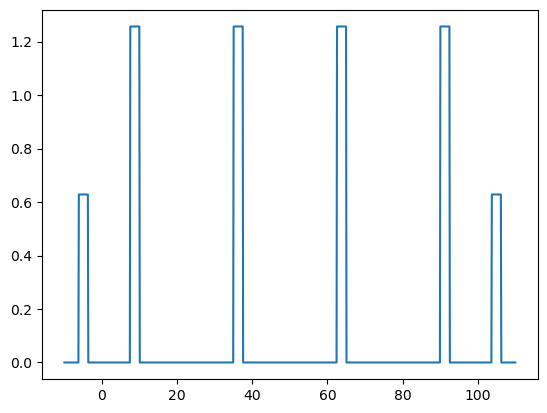

In [ ]:
# qubit pulse simulation (rotating frame)
tlist = np.linspace(-10, 110, 1000)
plt.figure()
plt.plot(tlist, Hqd_rotating_frame(tlist, {'B': 2*np.pi*0.2, 'T_srt': -5, 'T_end': 105, 'N_seq': 4, 'Env': 0, 'Func': 0}))

## 3) Photon Number n

kappa = 2 * np.pi * 0.01

### omega_r - omega_rd = 0

In [ ]:
A = [0.006875, 0.01, 0.0125, 0.01425, 0.016, 0.0175, 0.019, 0.0203, 0.022, 0.023]

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sp_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [ ]:
plus_list = []
alpha_list = []
n_list = []
for i in range(10):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[0])
  alpha_list.append(result.expect[1])
  n_list.append(result.expect[2])

/usr/local/lib/python3.10/dist-packages/qutip/solver/options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'Off Diagonal Term Expectation Value')

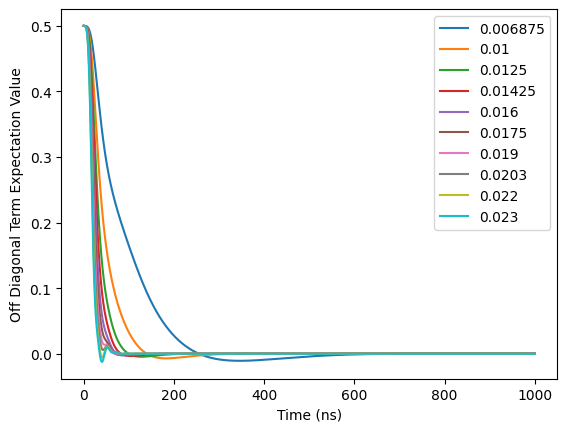

In [ ]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))
a
ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

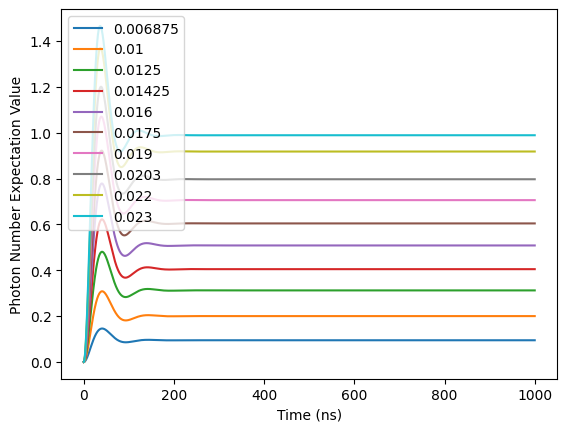

In [ ]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [ ]:
for i in range(10):
  print(alpha_list[i][-1])

(-3.489098116329914e-17-0.13749796842626044j)
(4.2961511084738113e-16-0.19994819994819607j)
(-2.3548871186385156e-16-0.24966590246532788j)
(2.174909558005922e-16-0.284037780810038j)
(-4.540638698369293e-16-0.31762466281260127j)
(9.13331910101789e-16-0.34534227653573146j)
(-3.625572064791527e-16-0.37156482785254374j)
(-9.575673587391975e-16-0.3926602977195714j)
(-1.0096090630185017e-15-0.4173391670886306j)
(1.5092094240998222e-15-0.43005410337521316j)


In [ ]:
for i in range(10):
  print(n_list[i][-1])

0.09452985329305193
0.1999481999481912
0.31208237808165057
0.40475383765429085
0.5081994605001503
0.6043489839375281
0.7059731729198391
0.7971004043707303
0.9181461675949858
0.9891244377629893


### omega_r - omega_rd = 0.01

In [ ]:
A = [0.006875, 0.01, 0.0125, 0.01425, 0.016, 0.0175, 0.019, 0.0203, 0.022, 0.023]

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.99  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sp_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [ ]:
plus_list = []
alpha_list = []
n_list = []
for i in range(10):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[0])
  alpha_list.append(result.expect[1])
  n_list.append(result.expect[2])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

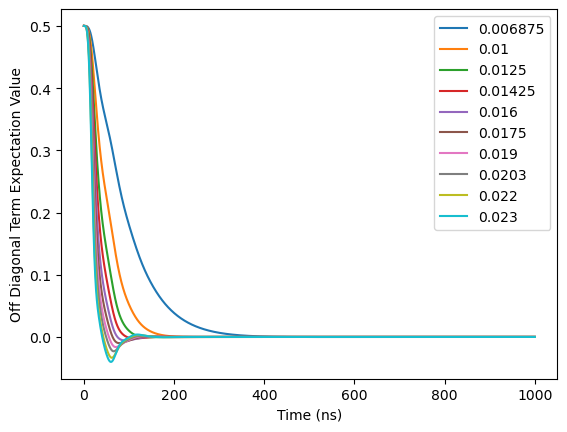

In [ ]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))
a
ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

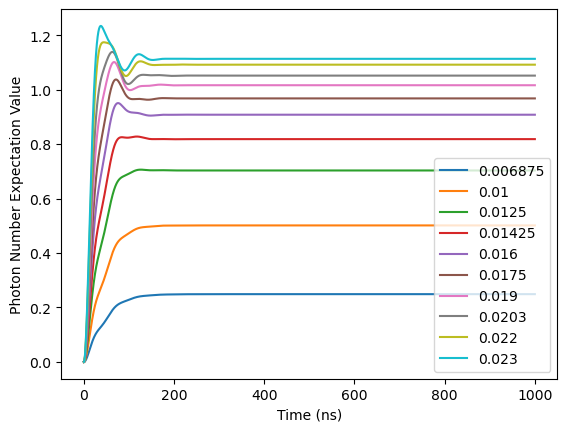

In [ ]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [ ]:
for i in range(10):
  print(alpha_list[i][-1])

(-0.08088234321623088-0.36201892929664126j)
(-0.1176467862209087-0.5013218089147781j)
(-0.14705687531063236-0.5625038336541135j)
(-0.16764093969870883-0.5742068539070988j)
(-0.18821860939854246-0.5674309835949992j)
(-0.20584635453793124-0.5530104385492147j)
(-0.22345698365329825-0.5348090348404096j)
(-0.23869708266321366-0.5179790732048455j)
(-0.25857654271584996-0.49621238327688844j)
(-0.27023210352806787-0.4839853956135537j)


In [ ]:
for i in range(10):
  print(n_list[i][-1])

0.24888801389143833
0.5013218089147777
0.7031297920676393
0.8182447668176143
0.9078895737519977
0.9677682674611227
1.016137166196775
1.0514975186058322
1.091667243209146
1.1131664099111631


### omega_r - omega_rd = 0.1

In [ ]:
A = [0.06875/7, 0.1/7, 0.125/7, 0.1425/7, 0.16/7, 0.175/7, 0.19/7, 0.203/7, 0.22/7, 0.23/7]

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.9  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sp_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [ ]:
plus_list = []
alpha_list = []
n_list = []
for i in range(10):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[0])
  alpha_list.append(result.expect[1])
  n_list.append(result.expect[2])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

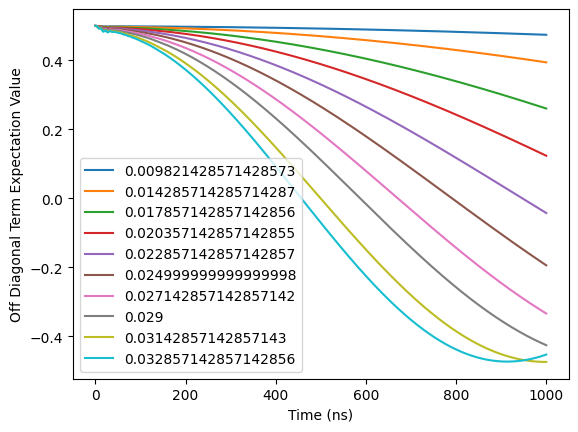

In [ ]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))
a
ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

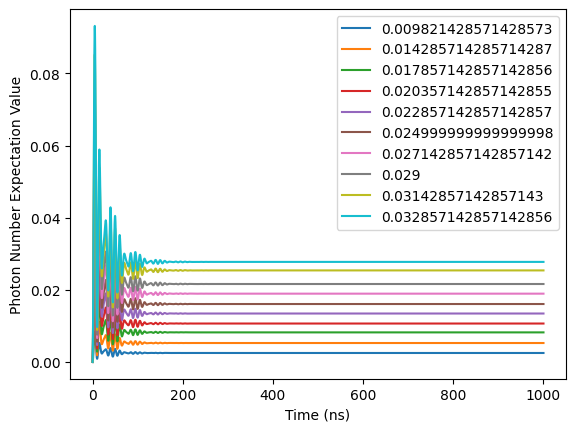

In [ ]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [ ]:
for i in range(10):
  print(alpha_list[i][-1])

(-0.04947320720465466-0.0025235074203868828j)
(-0.07196102864723897-0.0036705562470737622j)
(-0.08995128571762373-0.004588195303894185j)
(-0.10254446548713506-0.005230542633940789j)
(-0.11513764485273735-0.005872889942130782j)
(-0.12593179791231238-0.00642347331222661j)
(-0.1367259497684359-0.00697405661720559j)
(-0.14608087970890682-0.007451228724595777j)
(-0.1583142456728296-0.008075222804723267j)
(-0.16551034007495222-0.008442277971570464j)


In [ ]:
for i in range(10):
  print(n_list[i][-1])

0.0024784447878800154
0.00524365178153382
0.008193205899811257
0.010647890361951226
0.013423748439155747
0.016058683280566387
0.018929582246700348
0.02160856330132745
0.025379271671985934
0.027738913335158814


### omega_r - omega_rd = 0 for lower photon number scale

In [ ]:
A = [0.06875/100, 0.1/100, 0.125/100, 0.1425/100, 0.16/100, 0.175/100, 0.19/100, 0.203/100, 0.22/100, 0.23/100, 0.24/100, 0.25/100, 0.26/100, 0.27/100, 0.28/100,0.29/100, 0.3/100, 0.31/100, 0.32/100, 0.33/100]

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.99  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sp_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [ ]:
plus_list = []
alpha_list = []
n_list = []
for i in range(20):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[0])
  alpha_list.append(result.expect[1])
  n_list.append(result.expect[2])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

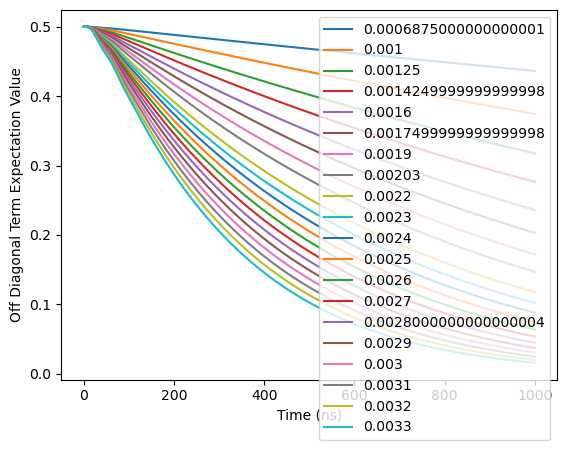

In [ ]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(20):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

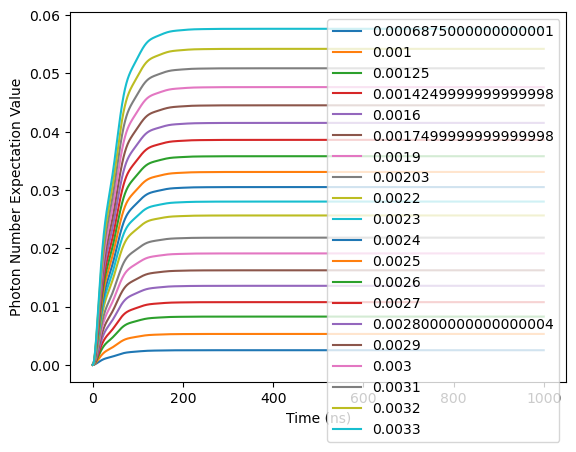

In [ ]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(20):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [ ]:
for i in range(20):
  print(alpha_list[i][-1])

(-0.008088235294117667-0.03639705881997563j)
(-0.011764705882352714-0.05294117636771514j)
(-0.014705882352939058-0.06617646982715247j)
(-0.016764705882345896-0.07544117401005049j)
(-0.01882352941174461-0.08470587542033428j)
(-0.0205882352940726-0.09264704339144166j)
(-0.022352941176376265-0.10058820316609825j)
(-0.023882352941005294-0.10747053032134796j)
(-0.025882352940823656-0.11647046987553393j)
(-0.027058823528885372-0.12176453029354216j)
(-0.028235294116875278-0.1270585675036075j)
(-0.029411764704768247-0.1323525737515305j)
(-0.0305882352925325-0.1376465392054418j)
(-0.031764705880127385-0.1429404515290235j)
(-0.03294117646750197-0.14823429539327698j)
(-0.03411764705459276-0.15352805192206845j)
(-0.035294117641321066-0.15882169806684038j)
(-0.036470588227590084-0.16411520590604498j)
(-0.037647058813281835-0.1694085418651322j)
(-0.038823529398253814-0.17470166585324706j)


In [ ]:
for i in range(20):
  print(n_list[i][-1])

0.0025022977938732685
0.005294117636771395
0.008272058728393872
0.010750367296431949
0.013552940067253176
0.016213232593501926
0.019111758601558233
0.02181651765523315
0.0256235033726169
0.028005841967514065
0.030494056200865104
0.03308814343788189
0.03578810019341405
0.03859392191283551
0.041505602710116676
0.04452313505739886
0.04764650942005106
0.05087571383087283
0.05421073339684114
0.05765154973157027


### omega_r - omega_rd = 0.01 for lower photon number scale

In [ ]:
A = [0.06875/30, 0.1/30, 0.125/30, 0.1425/30, 0.16/30, 0.175/30, 0.19/30, 0.203/30, 0.22/30, 0.23/30, 0.24/30, 0.25/30, 0.26/30, 0.27/30, 0.28/30, 0.29/30, 0.3/30, 0.31/30, 0.32/30, 0.33/30]

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.99  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sp_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [ ]:
plus_list = []
alpha_list = []
n_list = []
for i in range(20):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[0])
  alpha_list.append(result.expect[1])
  n_list.append(result.expect[2])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

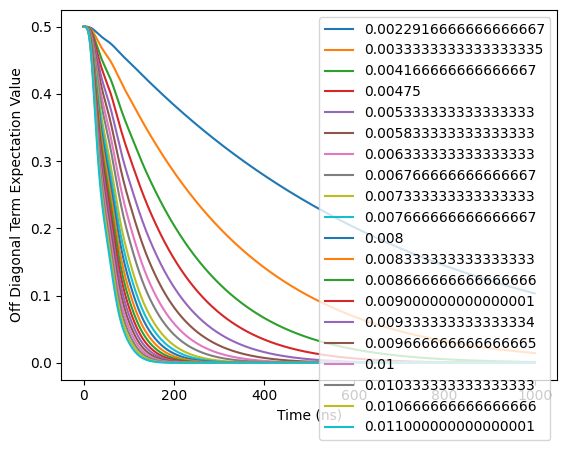

In [ ]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(20):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

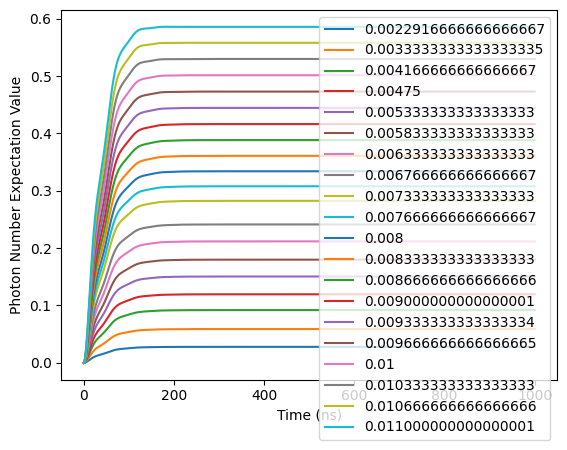

In [ ]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(20):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [ ]:
for i in range(20):
  print(alpha_list[i][-1])

(-0.026960784312603892-0.12132335938196114j)
(-0.03921568625969128-0.17646598542595318j)
(-0.04901960773346445-0.22055655182133538j)
(-0.05588235258588941-0.25137416267936497j)
(-0.06274509703588471-0.28209931792075377j)
(-0.06862744874207968-0.3082948843205633j)
(-0.0745097992505221-0.33427014022116397j)
(-0.07960783469848107-0.3565104705147761j)
(-0.0862744925033213-0.38503344881092516j)
(-0.09019605271520086-0.4014116004196493j)
(-0.09411760948510883-0.4174121690901571j)
(-0.09803916164836471-0.43296294660992607j)
(-0.101960707721907-0.4479882300476119j)
(-0.10588224583657645-0.46241091778677235j)
(-0.1098037736589243-0.47615487361535386j)
(-0.11372528830154052-0.4891474207452043j)
(-0.11764678622087747-0.5013218089147782j)
(-0.12156826310151543-0.512619494630931j)
(-0.12548971372582324-0.5229920880273865j)
(-0.12941113182793745-0.5324028481797339j)


In [ ]:
for i in range(20):
  print(n_list[i][-1])

0.02780326985836546
0.058821995141983094
0.09189856325888776
0.11940272727269585
0.15045296955773238
0.17983868252032575
0.21170442214006815
0.24123875171499592
0.2823578624613432
0.3077488936550628
0.33392973527212394
0.36080245550827056
0.38825646604126224
0.4161698260080939
0.4444112153743288
0.47284250672036277
0.5013218089147781
0.5297068111186276
0.5578582272292124
0.5856431329977069


#### omega_r - omega_rd = 0.01 for lower photon number scale

In [ ]:
A = [0.06875/100, 0.1/100, 0.125/100, 0.1425/100, 0.16/100, 0.175/100, 0.19/100, 0.203/100, 0.22/100, 0.23/100, 0.24/100, 0.25/100, 0.26/100, 0.27/100, 0.28/100,0.29/100, 0.3/100, 0.31/100, 0.32/100, 0.33/100]

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.99  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.003   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sp_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [ ]:
plus_list = []
alpha_list = []
n_list = []
for i in range(20):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[0])
  alpha_list.append(result.expect[1])
  n_list.append(result.expect[2])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

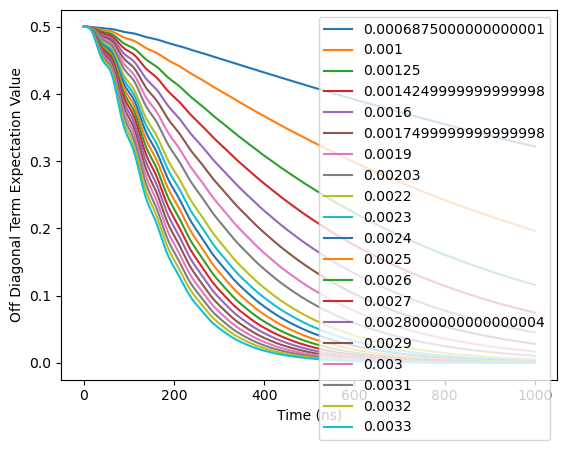

In [ ]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(20):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

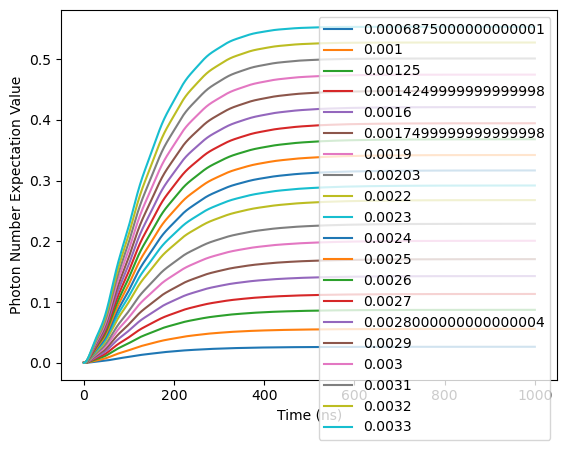

In [ ]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(20):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [ ]:
for i in range(20):
  print(alpha_list[i][-1])

(-0.008544990914516515-0.11521479164607916j)
(-0.012429077693940228-0.16758081695324809j)
(-0.015536347117322767-0.2094502114871007j)
(-0.017711435713578645-0.23871320308053534j)
(-0.01988652431009055-0.2678841185012062j)
(-0.021750885972357026-0.2927480081791673j)
(-0.023615247625979146-0.31739232744285056j)
(-0.025231027725773656-0.3384799665596805j)
(-0.027343970933128934-0.3654968769456461j)
(-0.02858687870209173-0.3809898041351834j)
(-0.029829786470972917-0.3961055976344305j)
(-0.03107269423975308-0.41077192689349223j)
(-0.03231560200836597-0.42491291234797174j)
(-0.033558509776762474-0.43845123702029154j)
(-0.03480141754487457-0.4513105380887111j)
(-0.03604432531262213-0.46341793728070424j)
(-0.0372872330799006-0.4747065467848583j)
(-0.038530140846571304-0.4851177816560668j)
(-0.03977304861250149-0.4946033224856387j)
(-0.041015956377489574-0.5031266027104332j)


In [ ]:
for i in range(20):
  print(n_list[i][-1])

0.026401259152298764
0.05585576982776362
0.08726392391170158
0.11337977359225049
0.1428604354643573
0.17075684672772862
0.20100084046164485
0.229022923442598
0.26801554963800317
0.29207709248349695
0.3168702811879211
0.34229713312879706
0.36824689634624186
0.39459735099611976
0.4212168021519809
0.44796669554177104
0.47470472652321494
0.5012882607437735
0.5275778505118939
0.553440619954511


## 3) RD 6.99GHz, n 0.002~0.057



B=0.05GHz

Resonator Dissipation Rate : $\kappa = 2π · 0.01$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A = [0.06875/100, 0.1/100, 0.125/100, 0.1425/100, 0.16/100, 0.175/100, 0.19/100, 0.203/100, 0.22/100, 0.23/100, 0.24/100, 0.25/100, 0.26/100, 0.27/100, 0.28/100,0.29/100, 0.3/100, 0.31/100, 0.32/100, 0.33/100]

n_exp =     [0.0025022977938732685,
0.005294117636771395,
0.008272058728393872,
0.010750367296431949,
0.013552940067253176,
0.016213232593501926,
0.019111758601558233,
0.02181651765523315,
0.0256235033726169,
0.028005841967514065,
0.030494056200865104,
0.03308814343788189,
0.03578810019341405,
0.03859392191283551,
0.041505602710116676,
0.04452313505739886,
0.04764650942005106,
0.05087571383087283,
0.05421073339684114,
0.05765154973157027]

alpha_exp = [(-0.008088235294117667-0.03639705881997563j),
(-0.011764705882352714-0.05294117636771514j),
(-0.014705882352939058-0.06617646982715247j),
(-0.016764705882345896-0.07544117401005049j),
(-0.01882352941174461-0.08470587542033428j),
(-0.0205882352940726-0.09264704339144166j),
(-0.022352941176376265-0.10058820316609825j),
(-0.023882352941005294-0.10747053032134796j),
(-0.025882352940823656-0.11647046987553393j),
(-0.027058823528885372-0.12176453029354216j),
(-0.028235294116875278-0.1270585675036075j),
(-0.029411764704768247-0.1323525737515305j),
(-0.0305882352925325-0.1376465392054418j),
(-0.031764705880127385-0.1429404515290235j),
(-0.03294117646750197-0.14823429539327698j),
(-0.03411764705459276-0.15352805192206845j),
(-0.035294117641321066-0.15882169806684038j),
(-0.036470588227590084-0.16411520590604498j),
(-0.037647058813281835-0.1694085418651322j),
(-0.038823529398253814-0.17470166585324706j)]

N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.99 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

In [ ]:
# iterate for photon number n
for i in range(20):

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, alpha_exp[i]))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = (omega_r-omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': 0, 'T_end': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


C:\Users\QDL_02\anaconda3\Lib\site-packages\matplotlib\cbook\__init__.py:1340: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'Decoherence')

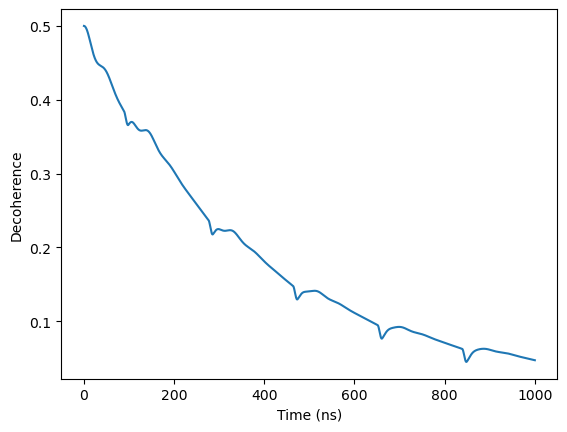

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

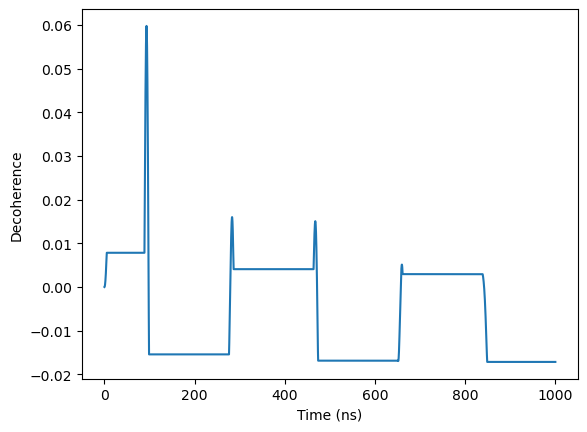

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

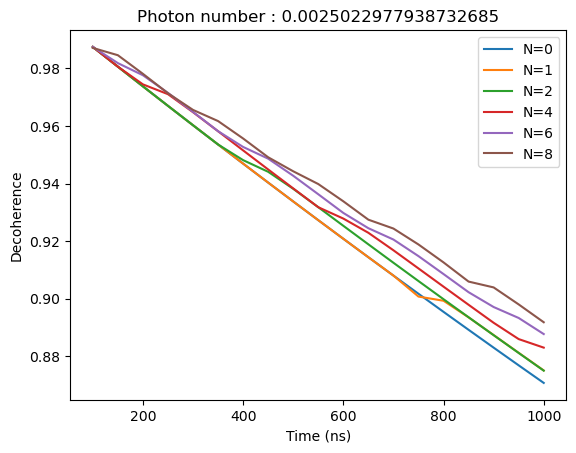

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

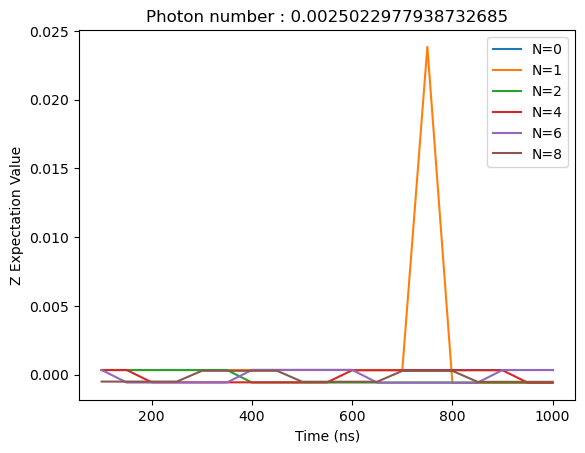

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

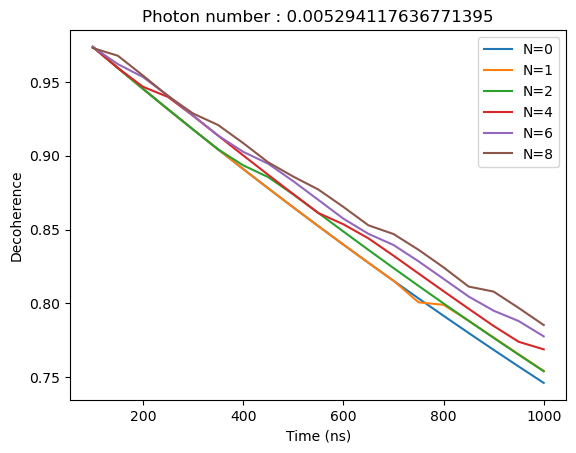

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

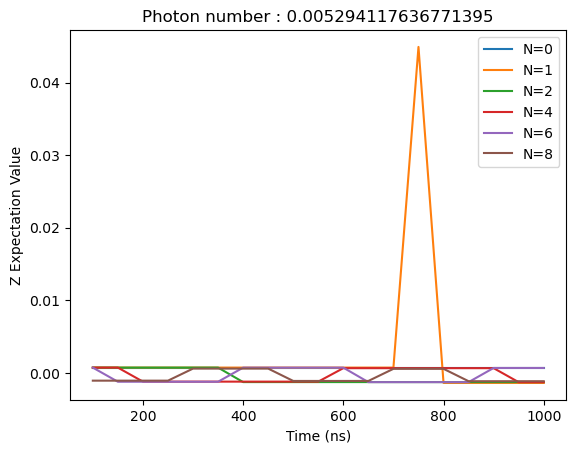

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

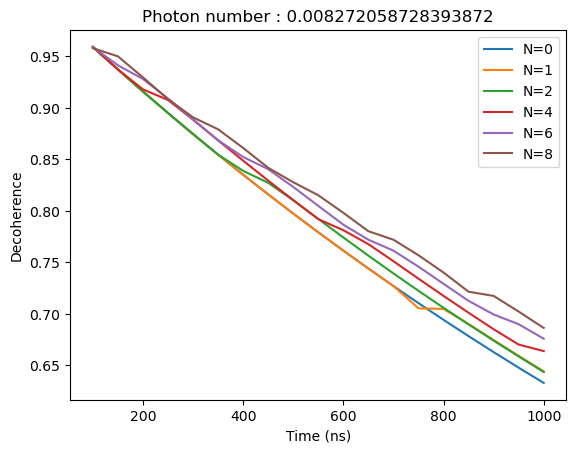

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

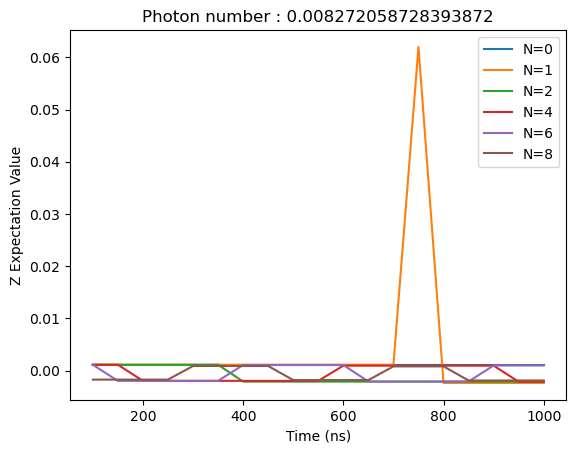

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

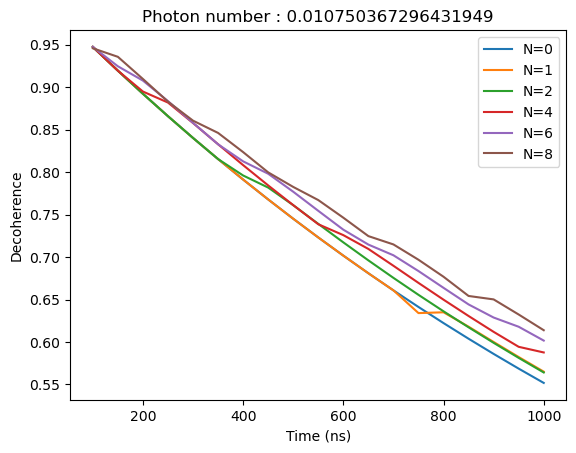

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

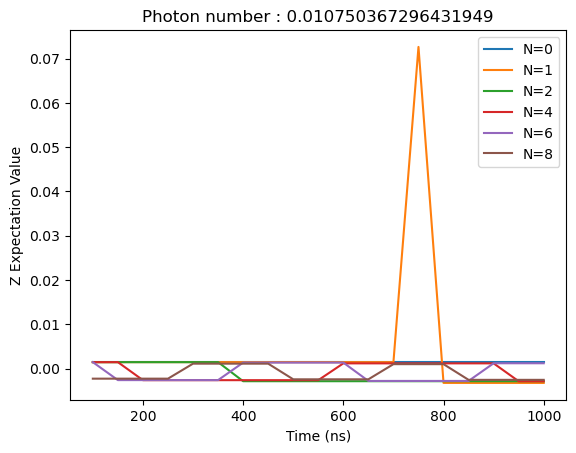

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

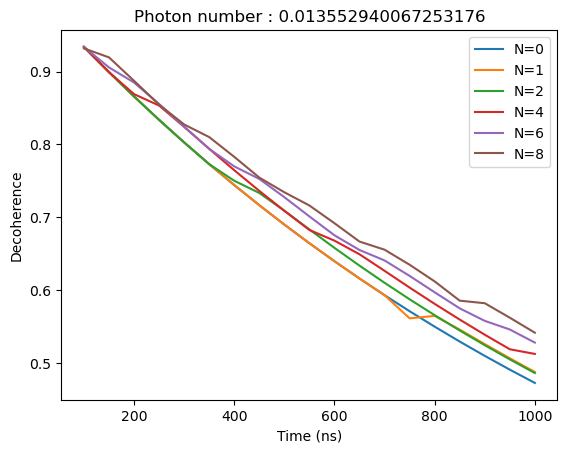

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

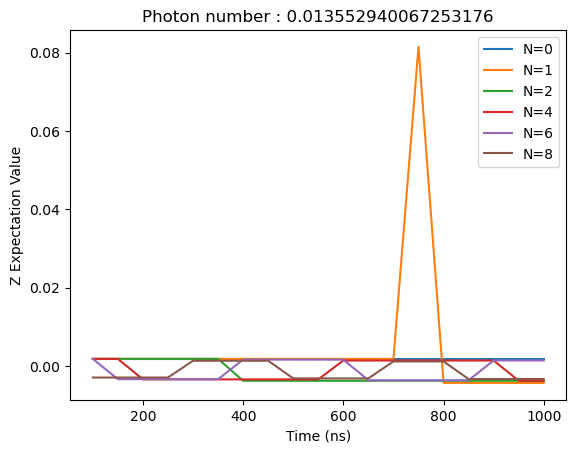

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

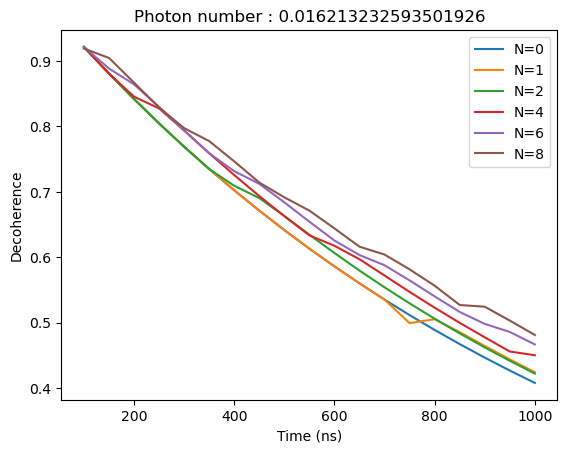

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

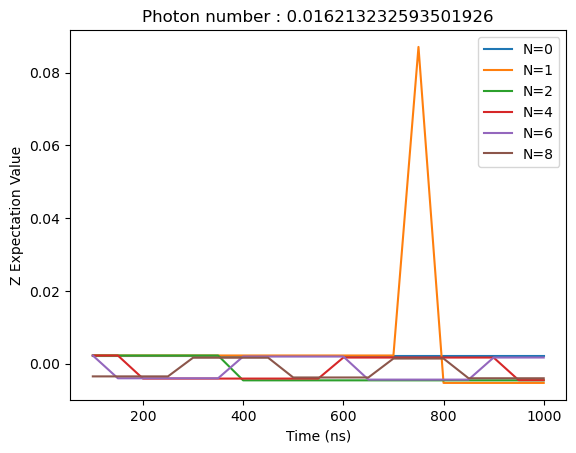

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

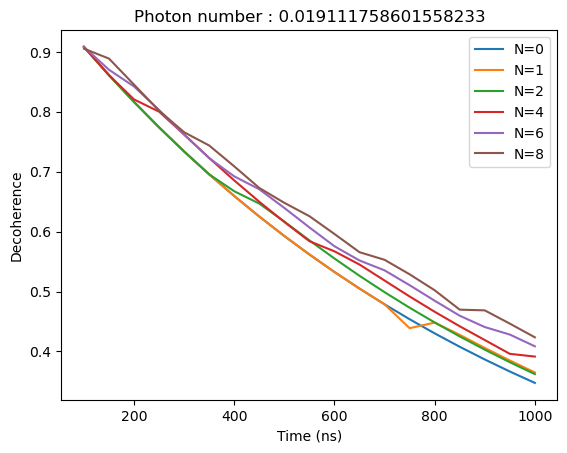

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

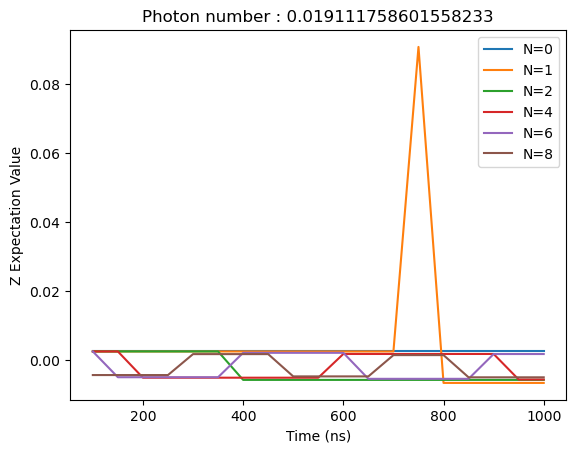

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

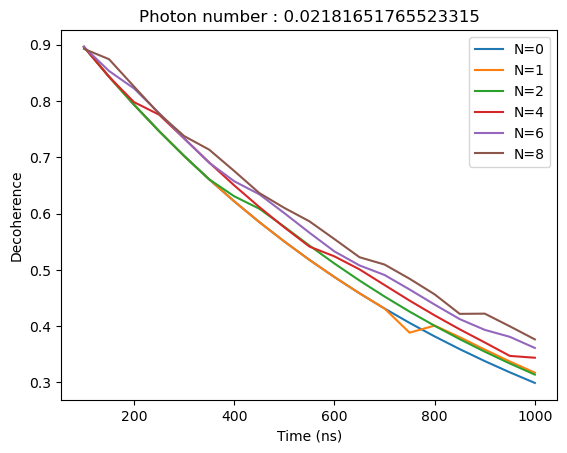

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

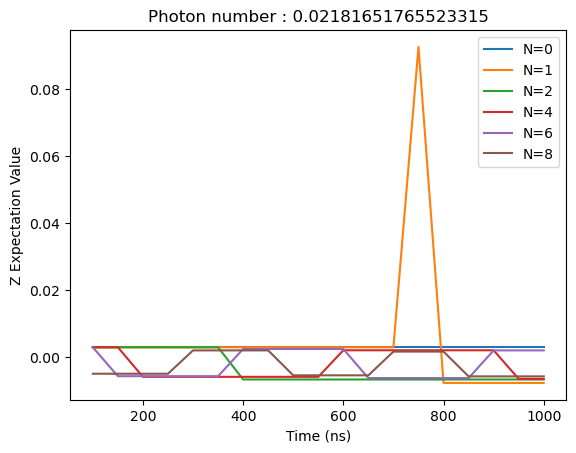

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

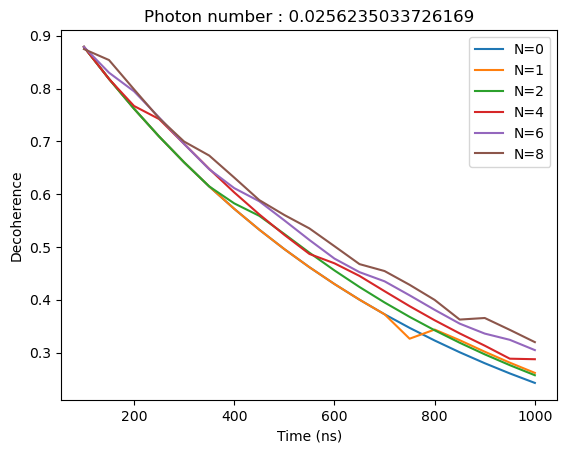

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

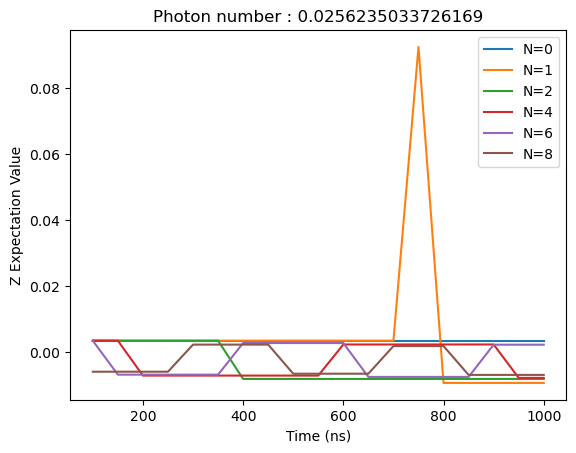

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

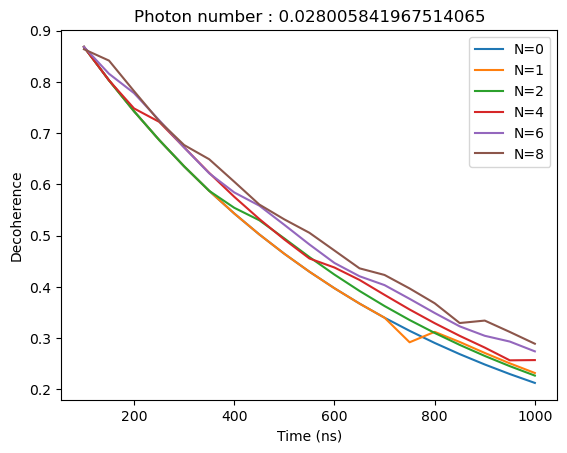

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

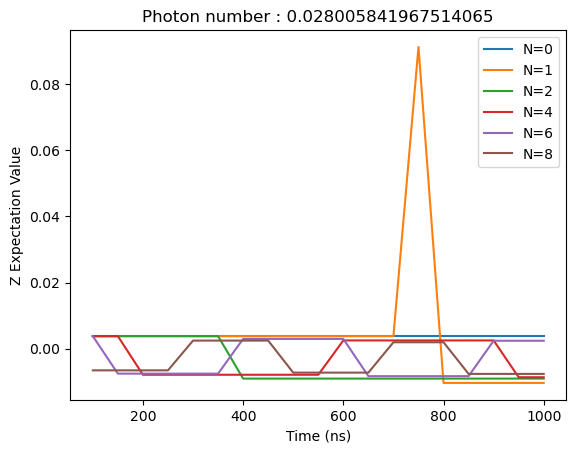

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

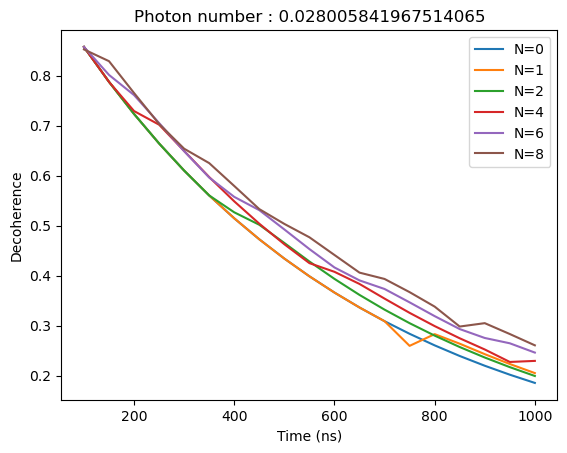

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[10][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

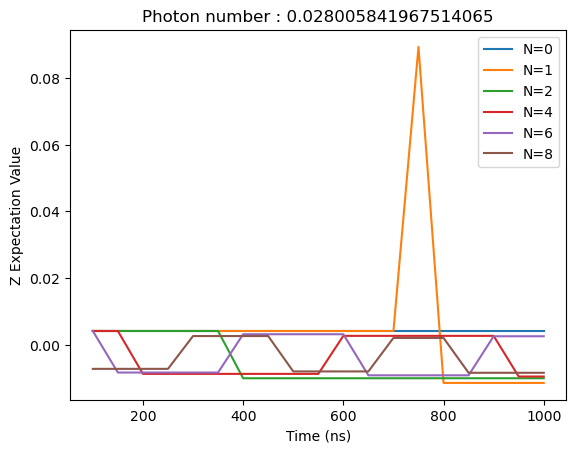

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[10][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

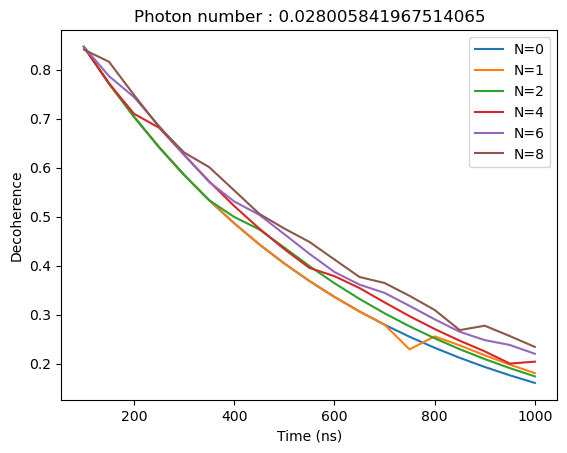

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[11][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

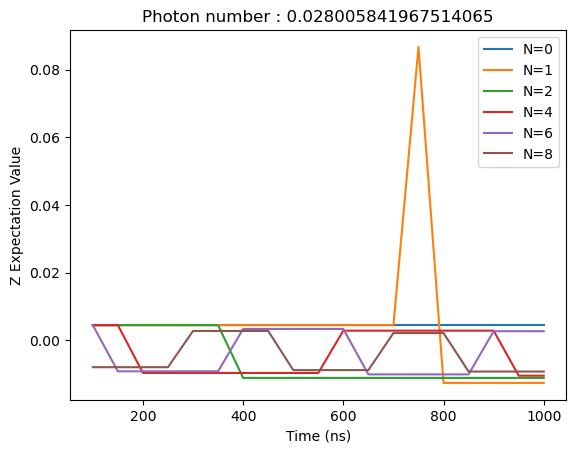

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[11][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

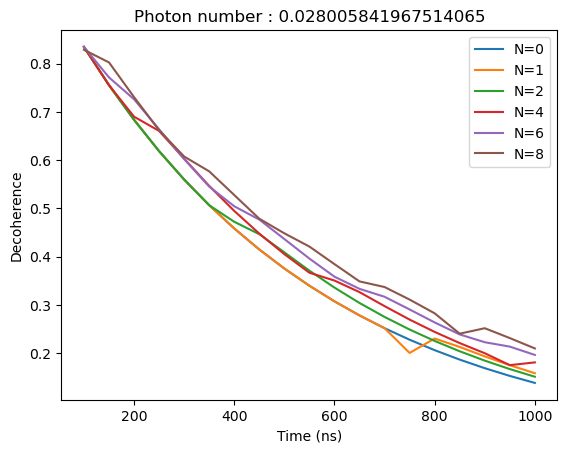

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[12][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

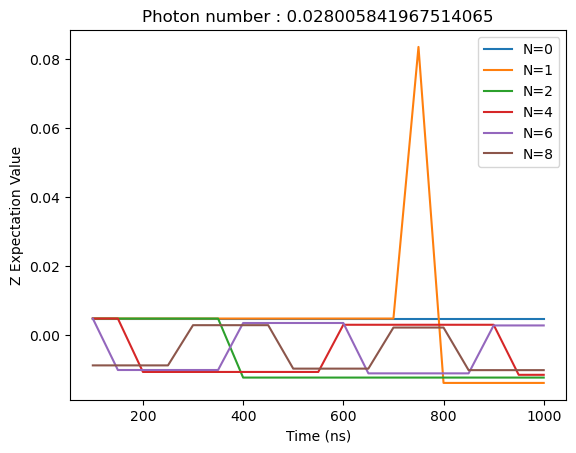

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[12][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

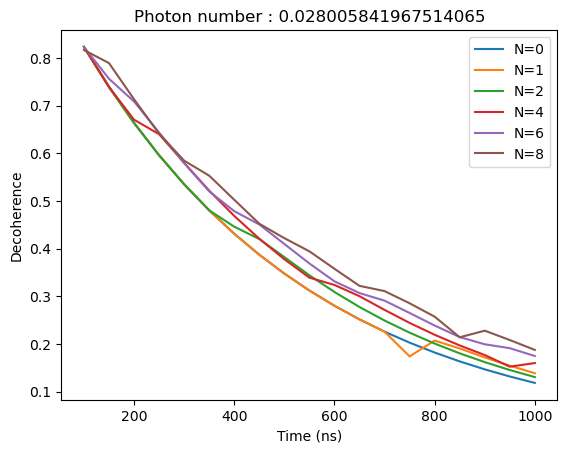

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[13][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

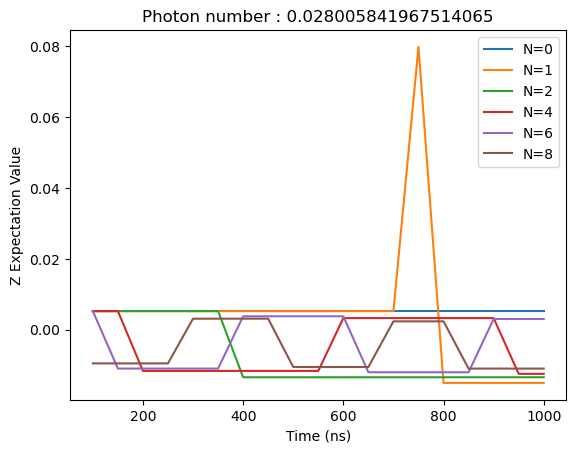

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[13][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

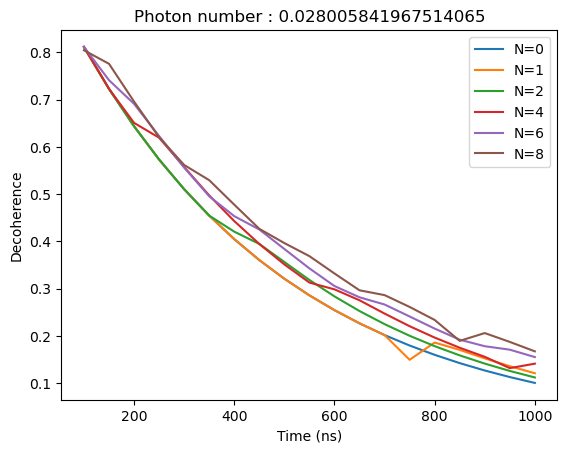

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[14][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

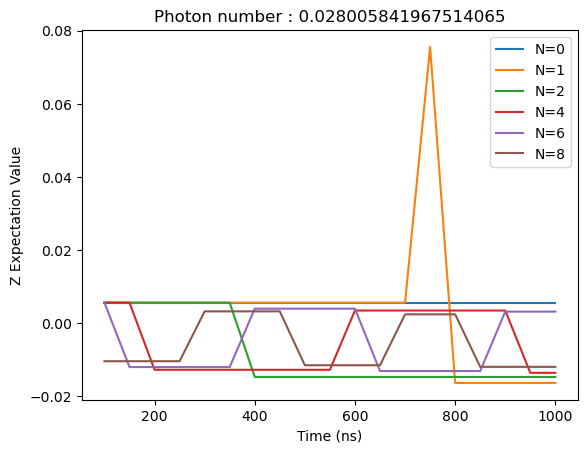

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[14][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

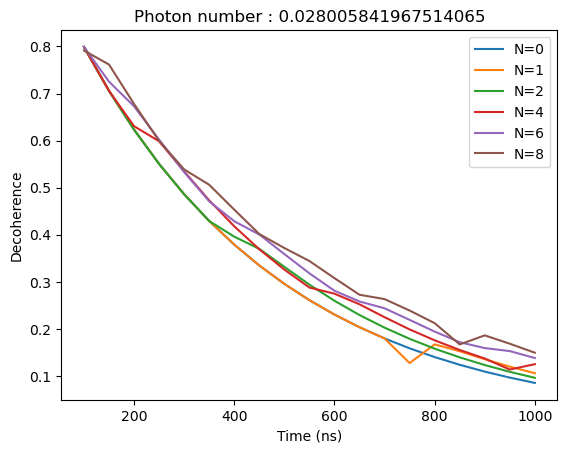

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[15][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

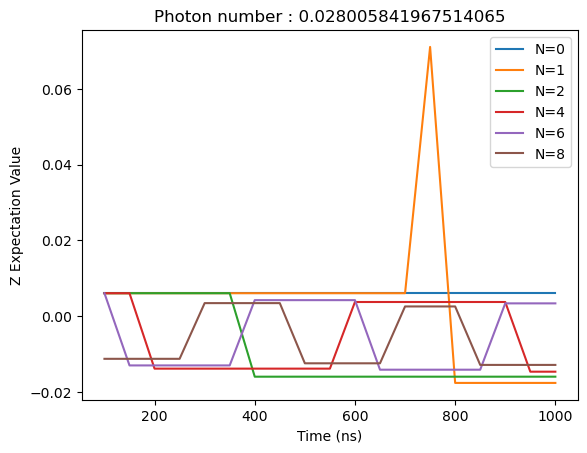

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[15][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

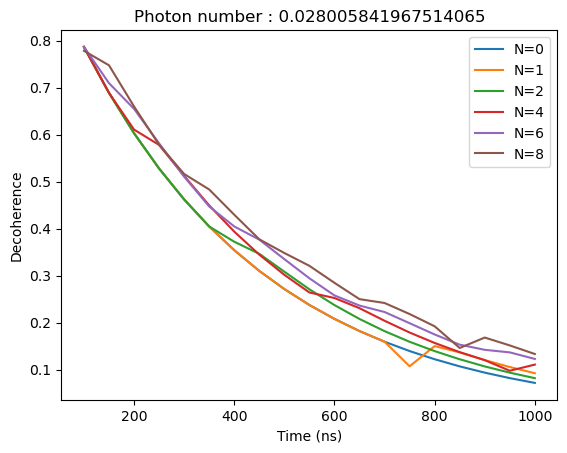

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[16][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

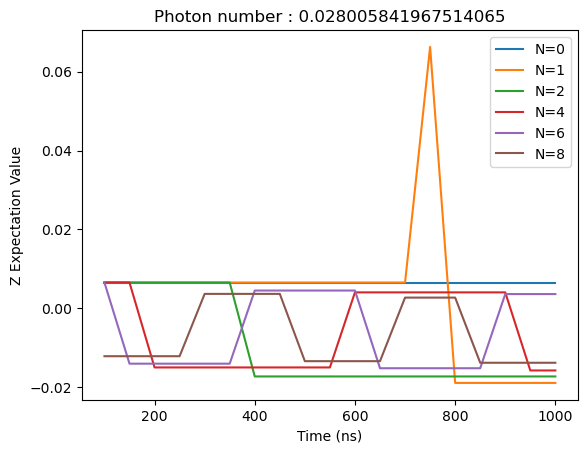

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[16][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

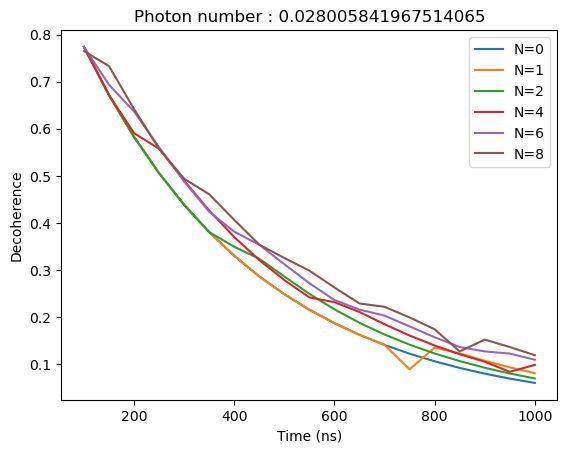

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[17][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

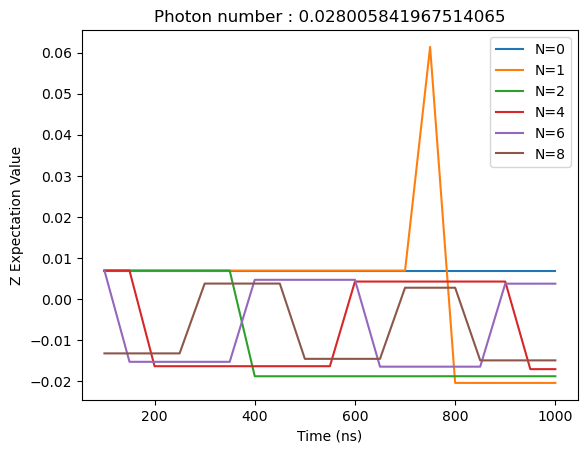

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[17][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

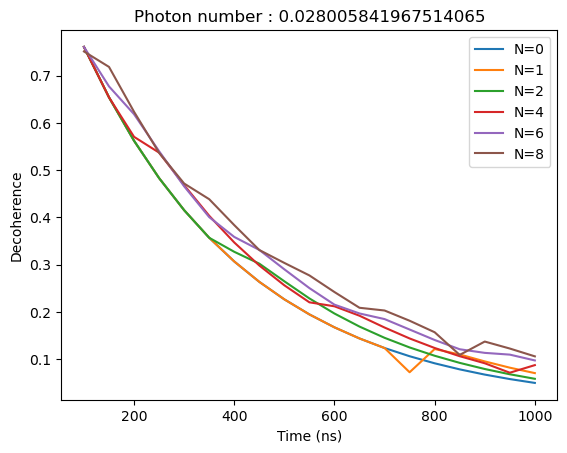

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[18][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

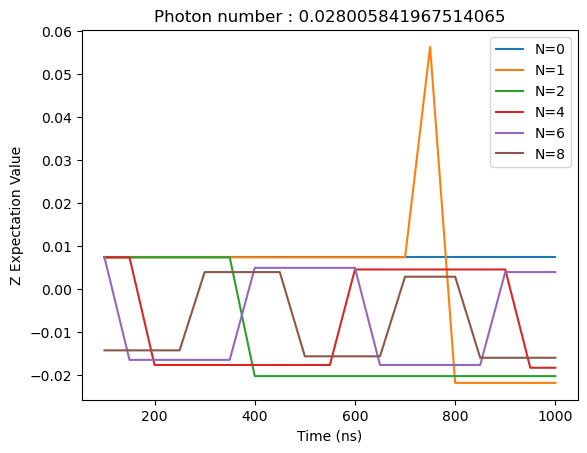

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[18][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

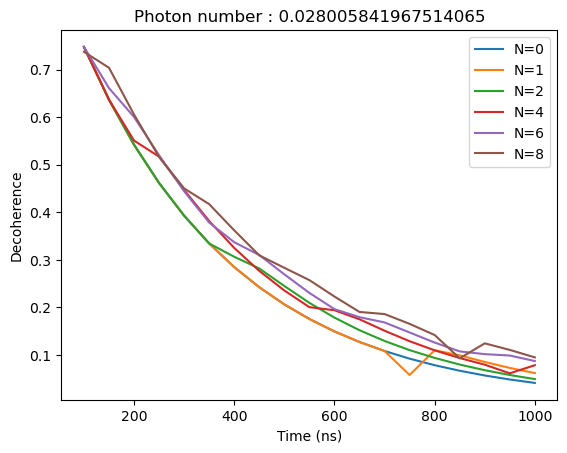

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[19][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

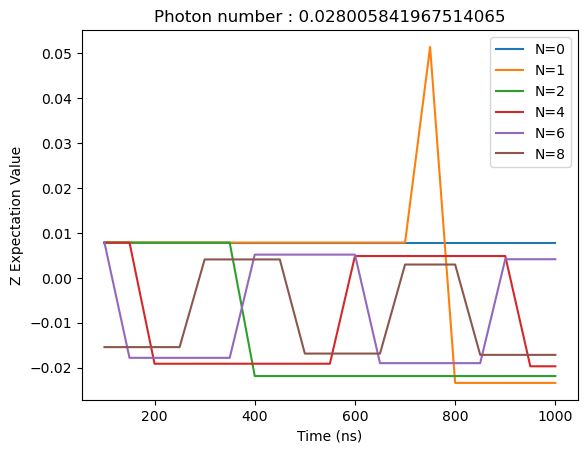

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[19][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

## 4) RD 6.99GHz, n 0.02~0.57



B=0.05GHz

Resonator Dissipation Rate : $\kappa = 2π · 0.01$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A = [0.06875/30, 0.1/30, 0.125/30, 0.1425/30, 0.16/30, 0.175/30, 0.19/30, 0.203/30, 0.22/30, 0.23/30, 0.24/30, 0.25/30, 0.26/30, 0.27/30, 0.28/30, 0.29/30, 0.3/30, 0.31/30, 0.32/30, 0.33/30]

n_exp = [0.02780326985836546,
0.058821995141983094,
0.09189856325888776,
0.11940272727269585,
0.15045296955773238,
0.17983868252032575,
0.21170442214006815,
0.24123875171499592,
0.2823578624613432,
0.3077488936550628,
0.33392973527212394,
0.36080245550827056,
0.38825646604126224,
0.4161698260080939,
0.4444112153743288,
0.47284250672036277,
0.5013218089147781,
0.5297068111186276,
0.5578582272292124,
0.5856431329977069]

alpha_exp = [(-0.026960784312603892-0.12132335938196114j),
(-0.03921568625969128-0.17646598542595318j),
(-0.04901960773346445-0.22055655182133538j),
(-0.05588235258588941-0.25137416267936497j),
(-0.06274509703588471-0.28209931792075377j),
(-0.06862744874207968-0.3082948843205633j),
(-0.0745097992505221-0.33427014022116397j),
(-0.07960783469848107-0.3565104705147761j),
(-0.0862744925033213-0.38503344881092516j),
(-0.09019605271520086-0.4014116004196493j),
(-0.09411760948510883-0.4174121690901571j),
(-0.09803916164836471-0.43296294660992607j),
(-0.101960707721907-0.4479882300476119j),
(-0.10588224583657645-0.46241091778677235j),
(-0.1098037736589243-0.47615487361535386j),
(-0.11372528830154052-0.4891474207452043j),
(-0.11764678622087747-0.5013218089147782j),
(-0.12156826310151543-0.512619494630931j),
(-0.12548971372582324-0.5229920880273865j),
(-0.12941113182793745-0.5324028481797339j)]

N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.99 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

In [ ]:
# iterate for photon number n
for i in range(20):

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, alpha_exp[i]))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = (omega_r-omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': 0, 'T_end': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


Text(0, 0.5, 'Decoherence')

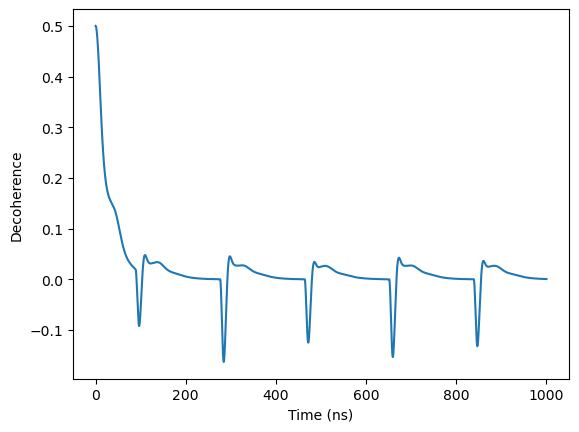

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

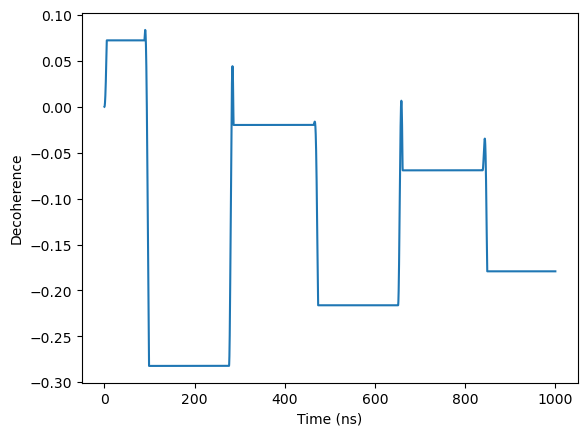

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

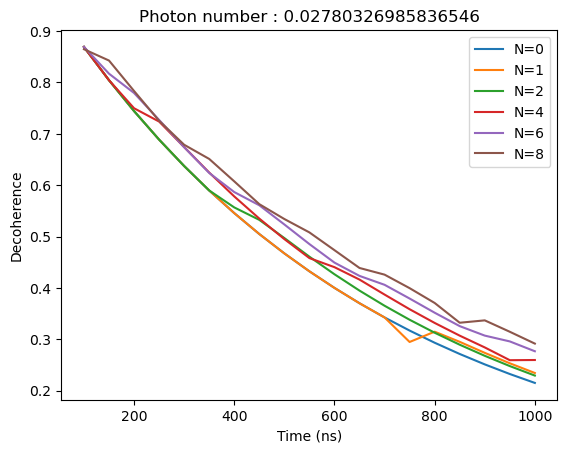

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

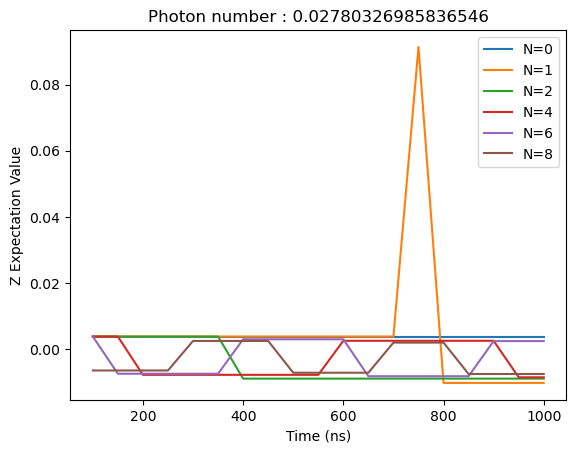

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

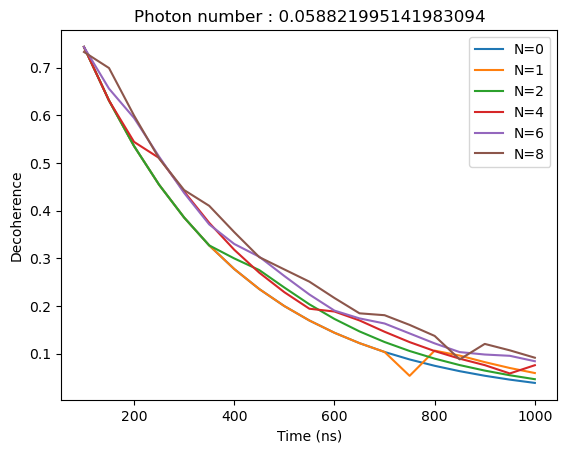

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

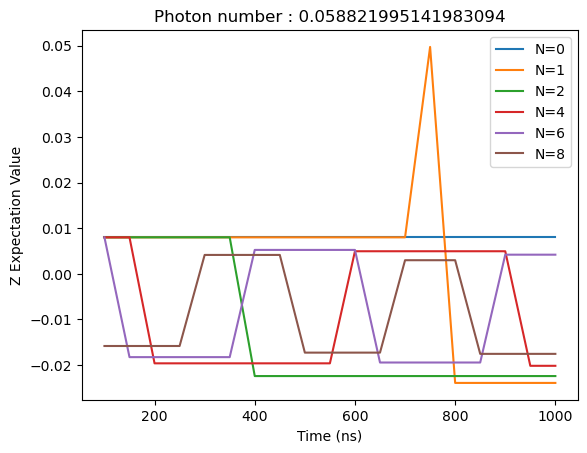

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

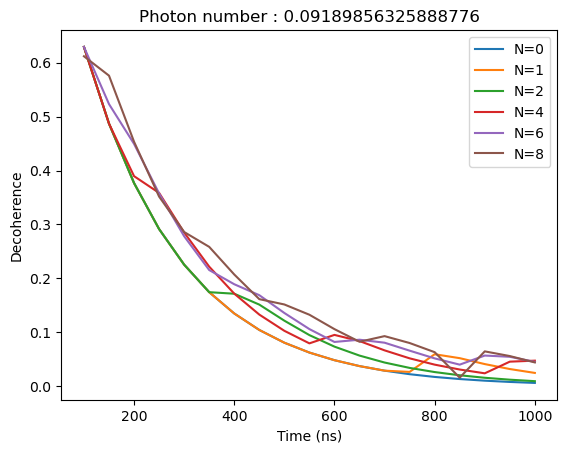

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

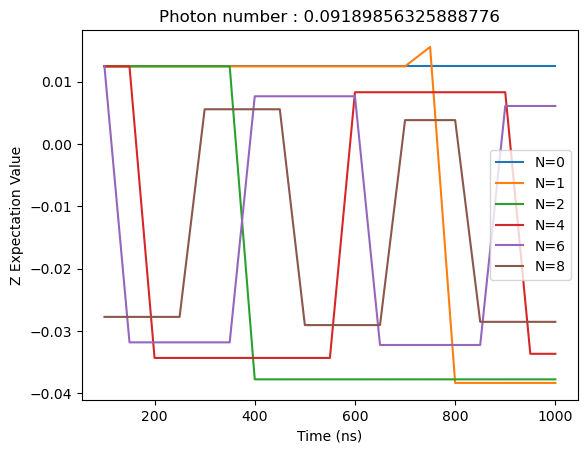

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

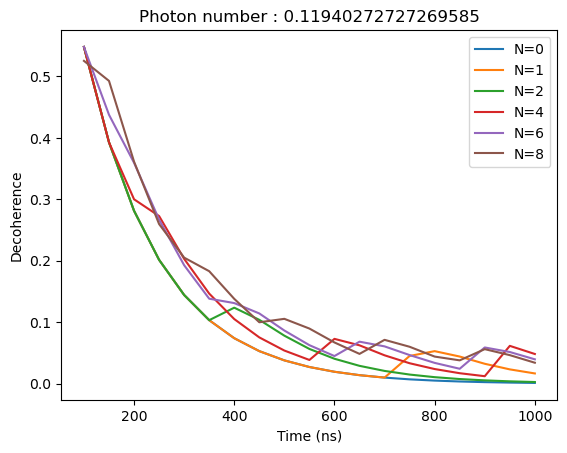

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

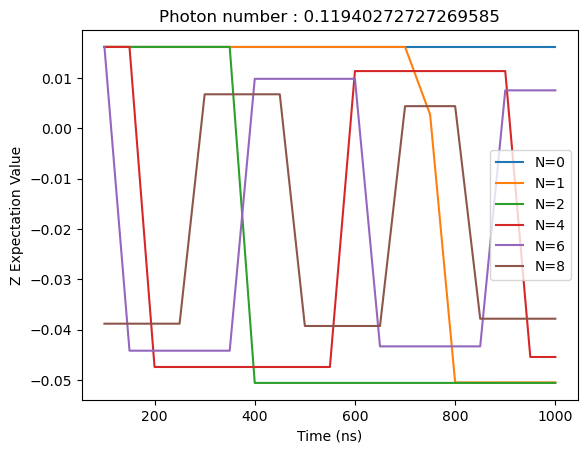

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

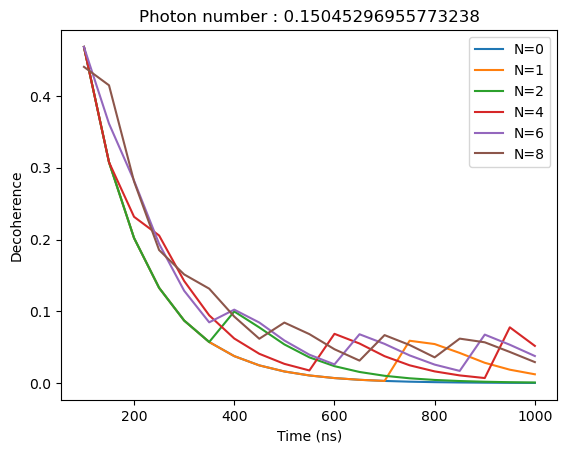

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

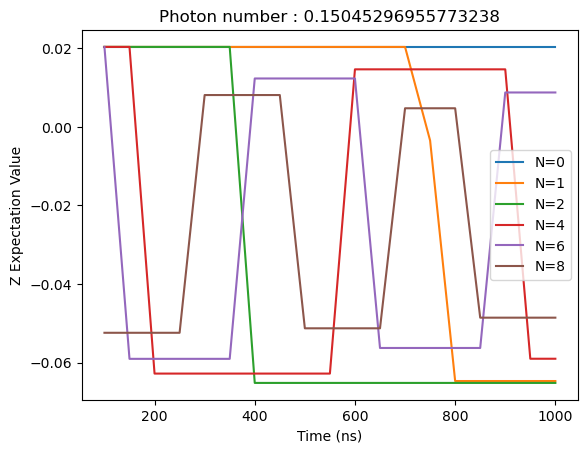

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

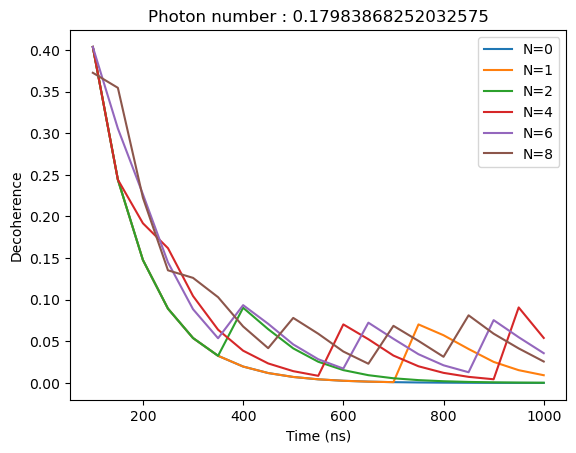

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

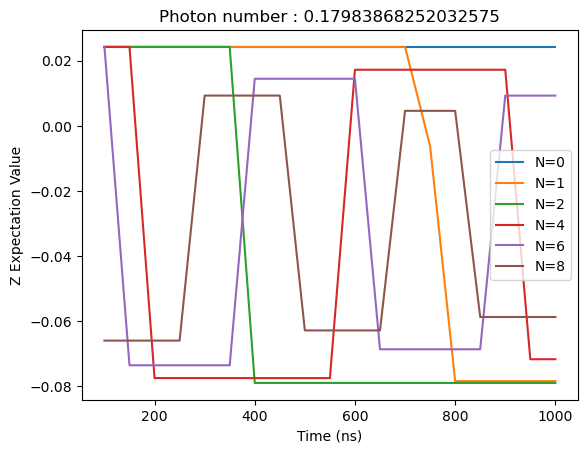

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

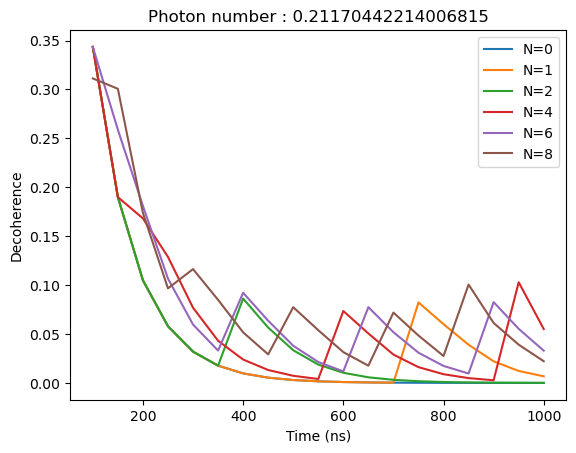

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

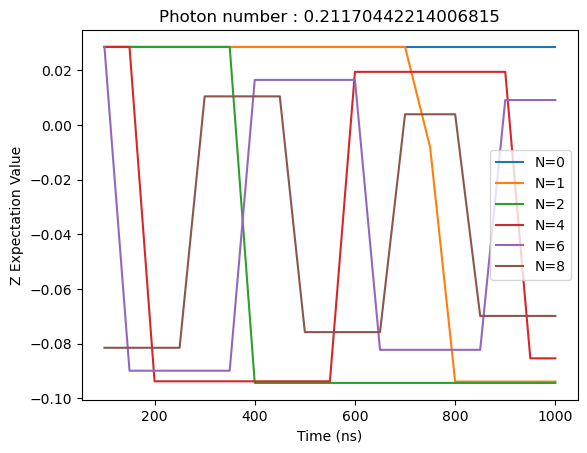

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

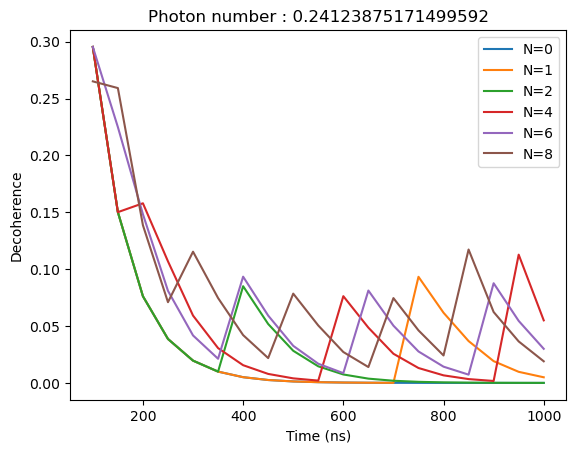

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

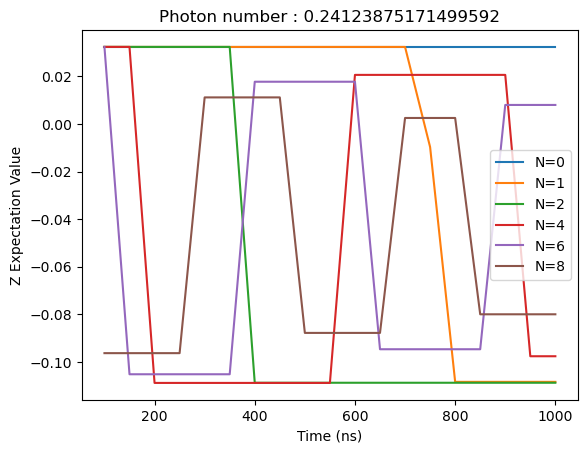

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

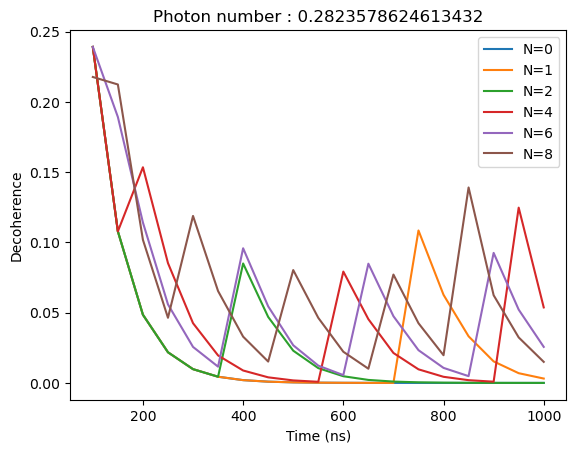

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

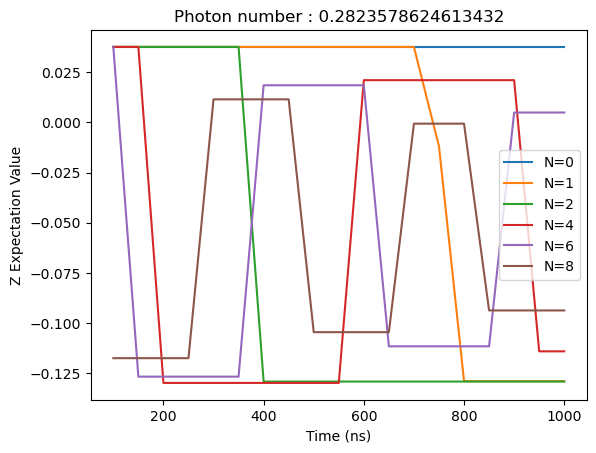

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

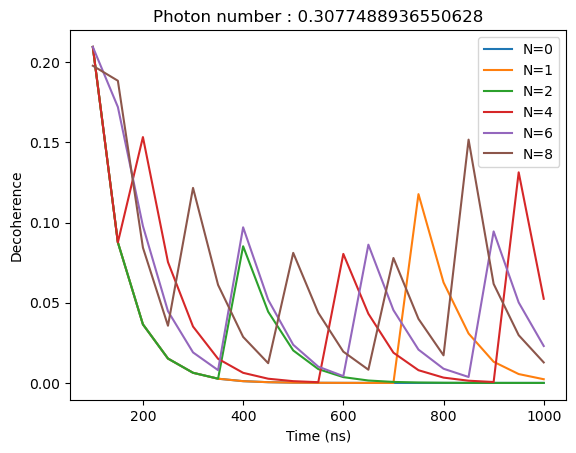

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

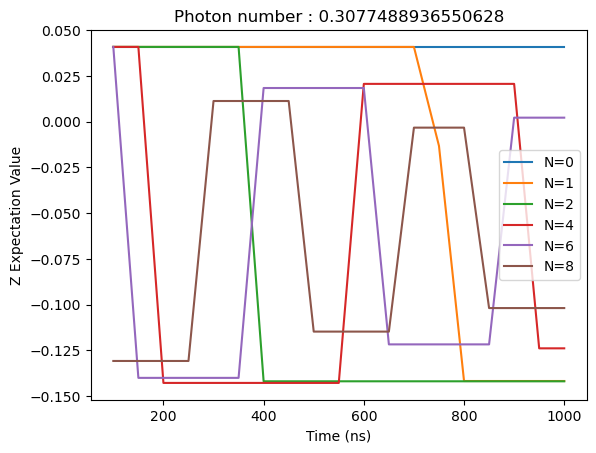

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

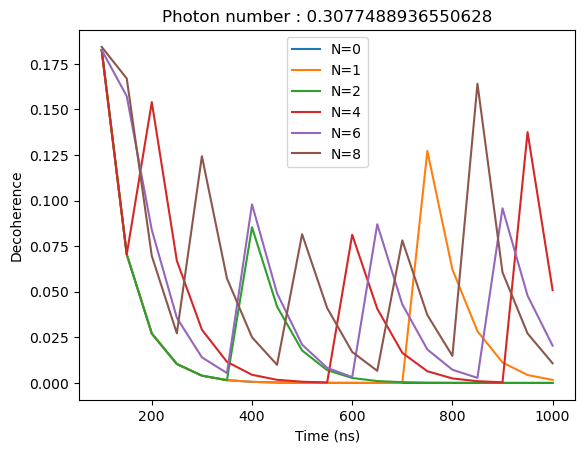

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[10][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

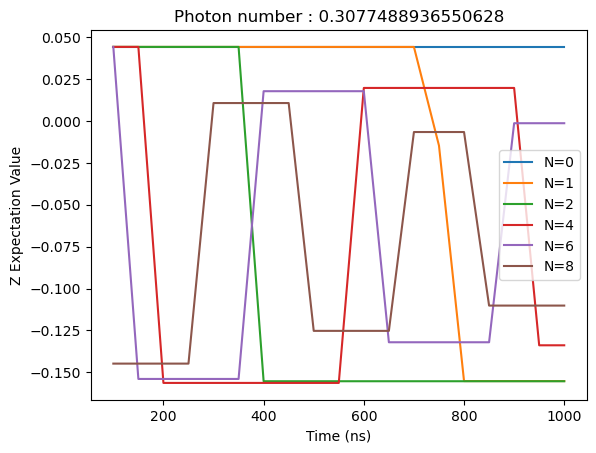

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[10][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

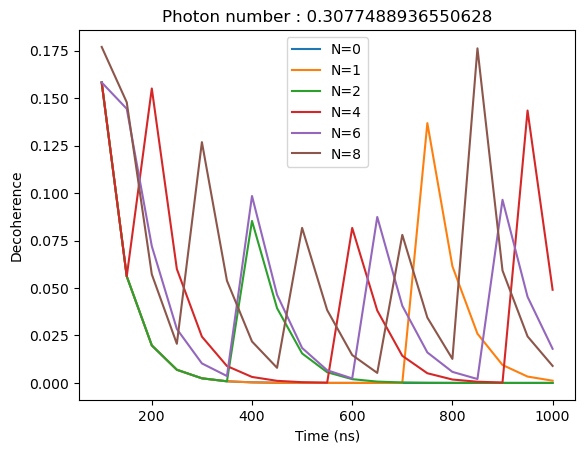

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[11][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

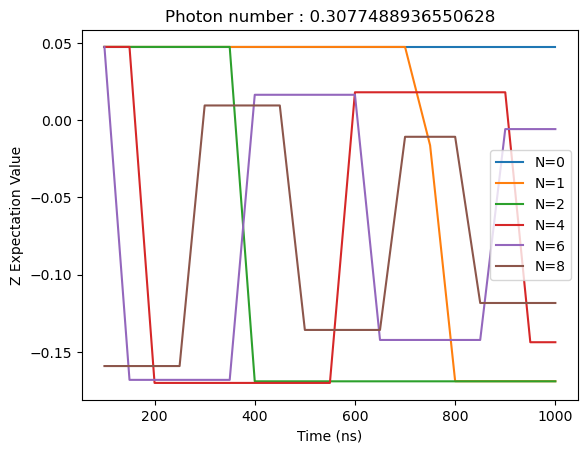

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[11][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

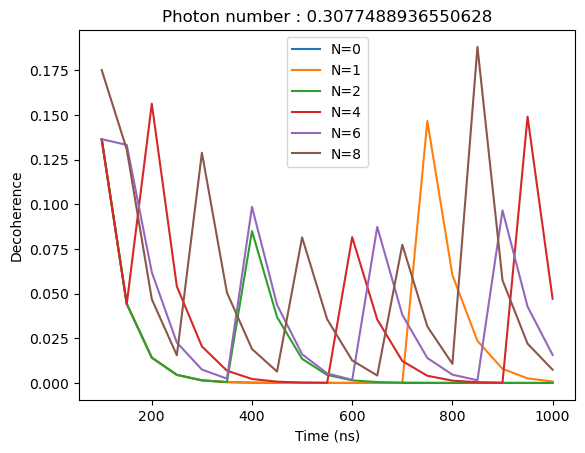

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[12][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

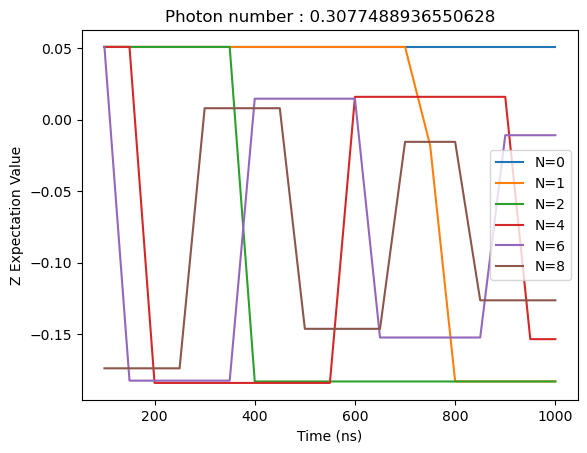

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[12][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

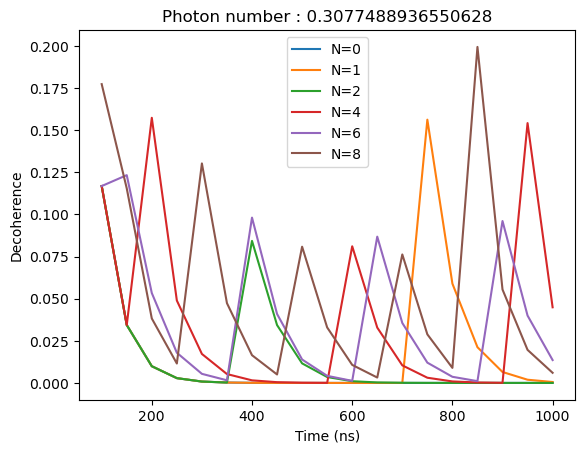

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[13][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

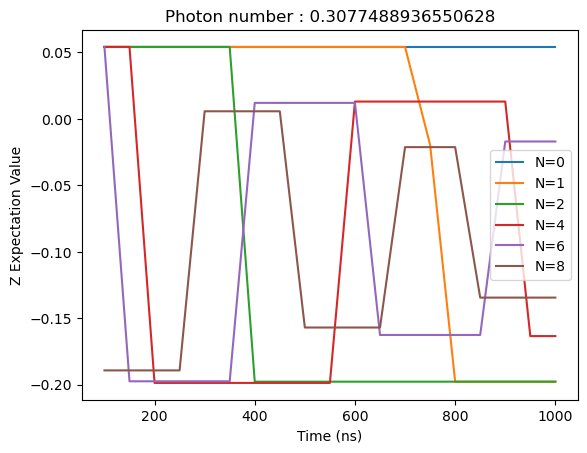

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[13][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

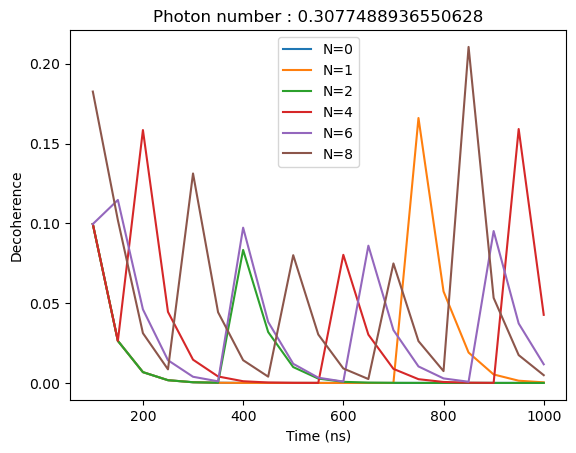

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[14][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

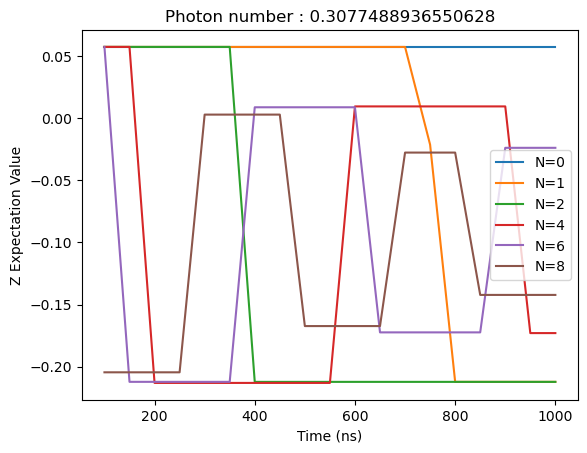

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[14][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

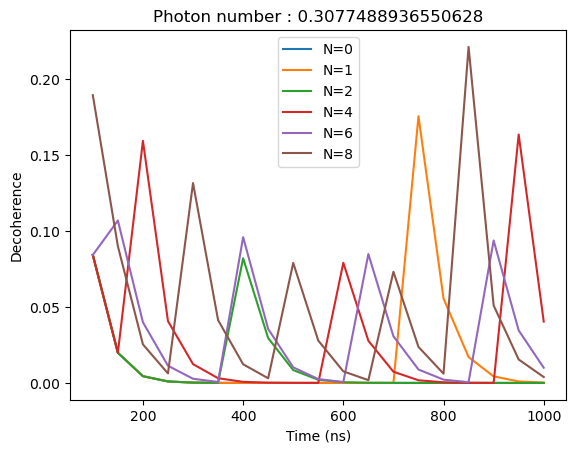

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[15][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

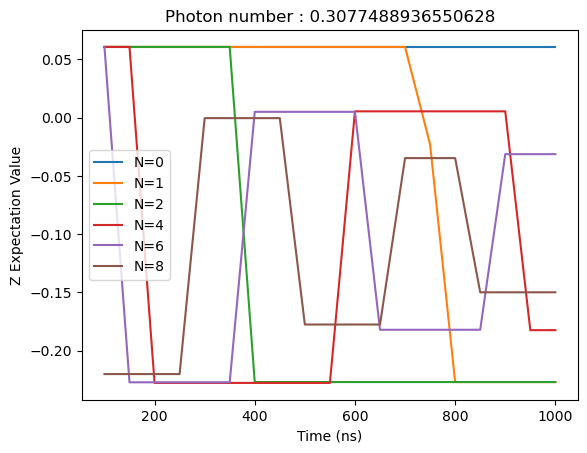

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[15][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

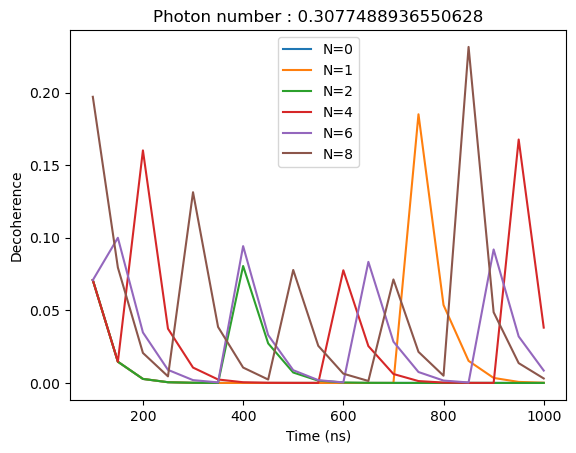

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[16][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

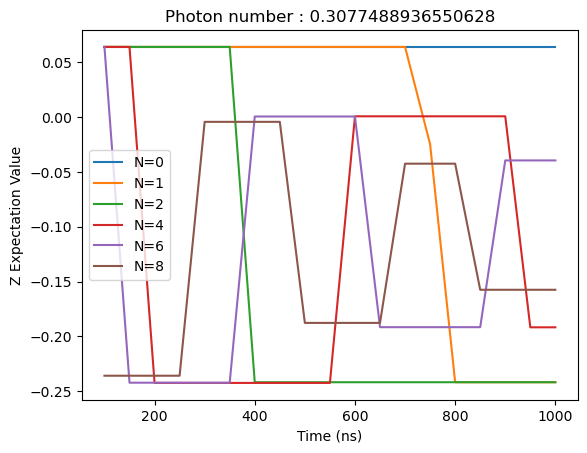

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[16][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

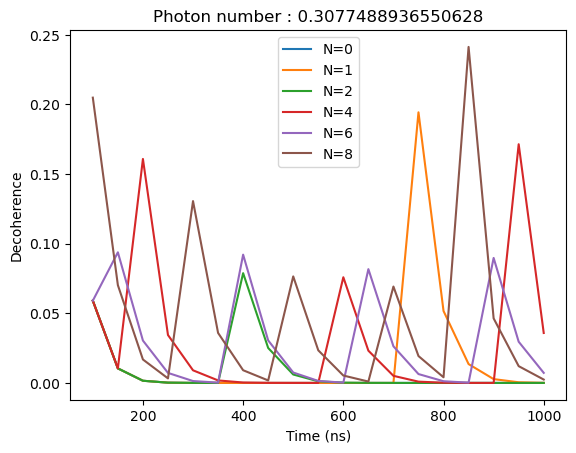

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[17][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

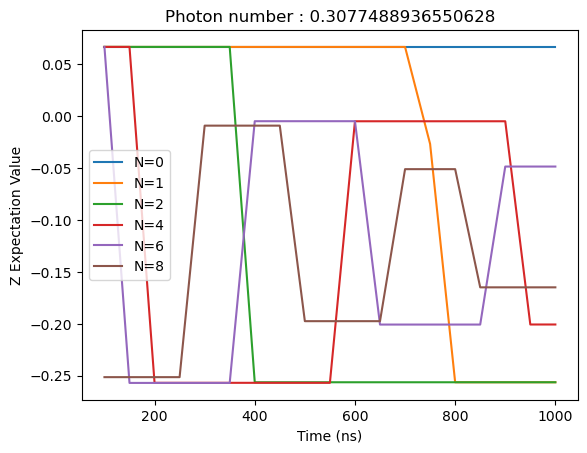

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[17][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

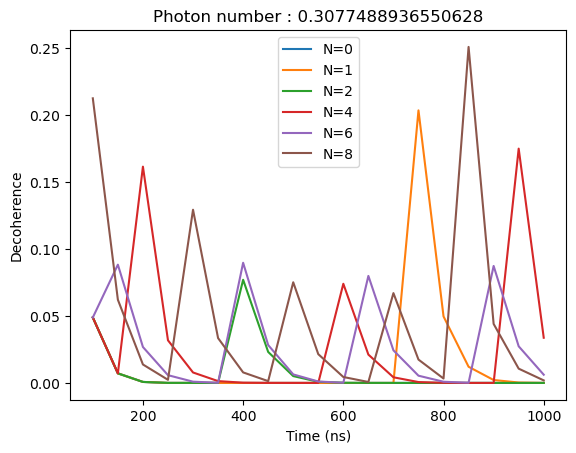

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[18][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

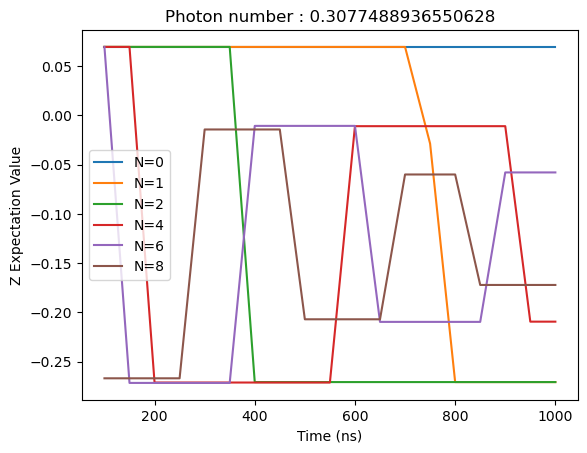

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[18][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

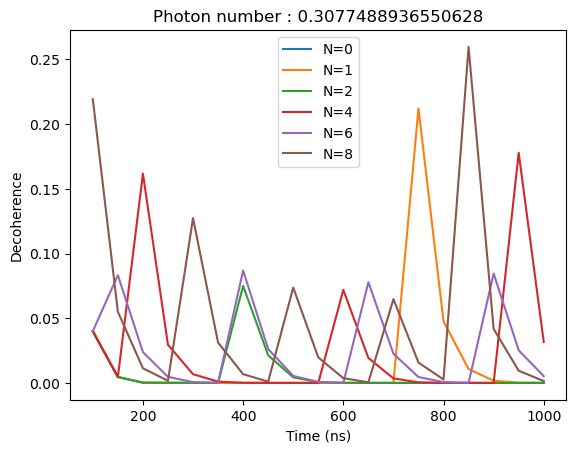

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[19][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

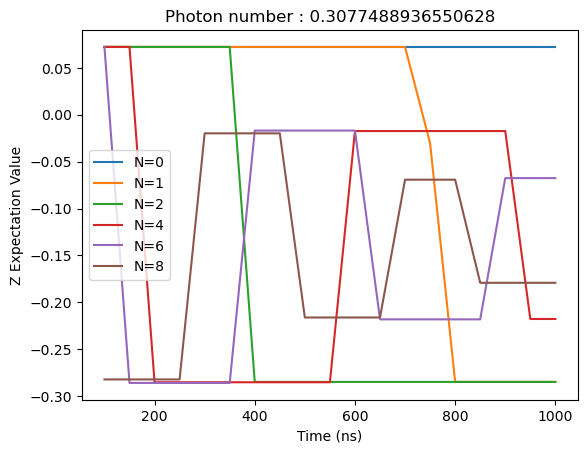

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[19][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

## 5) RD 6.99GHz, n 0.02~0.55



B=0.05GHz

Resonator Dissipation Rate : $\kappa = 2π · 0.003$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A = [0.06875/100, 0.1/100, 0.125/100, 0.1425/100, 0.16/100, 0.175/100, 0.19/100, 0.203/100, 0.22/100, 0.23/100, 0.24/100, 0.25/100, 0.26/100, 0.27/100, 0.28/100,0.29/100, 0.3/100, 0.31/100, 0.32/100, 0.33/100]

n_exp =     [0.026401259152298764,
0.05585576982776362,
0.08726392391170158,
0.11337977359225049,
0.1428604354643573,
0.17075684672772862,
0.20100084046164485,
0.229022923442598,
0.26801554963800317,
0.29207709248349695,
0.3168702811879211,
0.34229713312879706,
0.36824689634624186,
0.39459735099611976,
0.4212168021519809,
0.44796669554177104,
0.47470472652321494,
0.5012882607437735,
0.5275778505118939,
0.553440619954511]

alpha_exp = [(-0.008544990914516515-0.11521479164607916j),
(-0.012429077693940228-0.16758081695324809j),
(-0.015536347117322767-0.2094502114871007j),
(-0.017711435713578645-0.23871320308053534j),
(-0.01988652431009055-0.2678841185012062j),
(-0.021750885972357026-0.2927480081791673j),
(-0.023615247625979146-0.31739232744285056j),
(-0.025231027725773656-0.3384799665596805j),
(-0.027343970933128934-0.3654968769456461j),
(-0.02858687870209173-0.3809898041351834j),
(-0.029829786470972917-0.3961055976344305j),
(-0.03107269423975308-0.41077192689349223j),
(-0.03231560200836597-0.42491291234797174j),
(-0.033558509776762474-0.43845123702029154j),
(-0.03480141754487457-0.4513105380887111j),
(-0.03604432531262213-0.46341793728070424j),
(-0.0372872330799006-0.4747065467848583j),
(-0.038530140846571304-0.4851177816560668j),
(-0.03977304861250149-0.4946033224856387j),
(-0.041015956377489574-0.5031266027104332j)]

N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.99 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.003   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

In [ ]:
# iterate for photon number n
for i in range(20):

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, alpha_exp[i]))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = (omega_r-omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': 0, 'T_end': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


Text(0, 0.5, 'Decoherence')

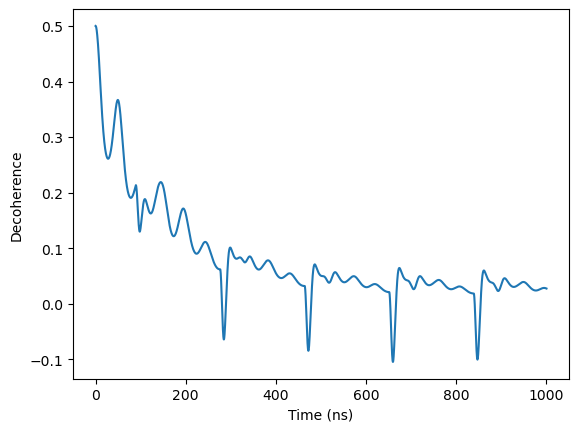

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

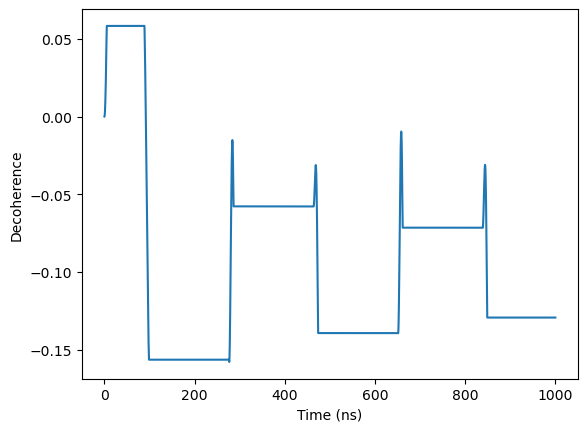

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

#### n=0.1

Text(0, 0.5, 'Decoherence')

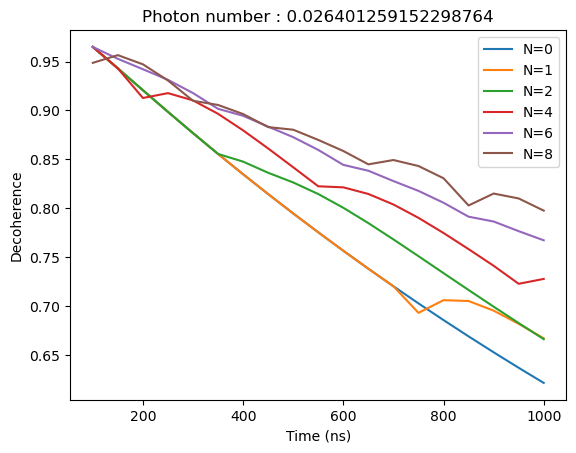

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

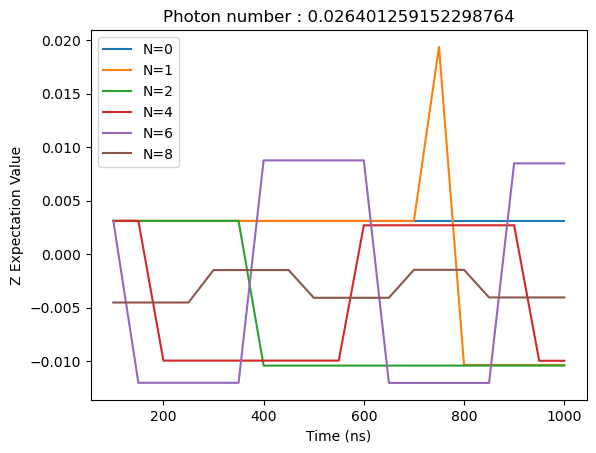

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.2

Text(0, 0.5, 'Decoherence')

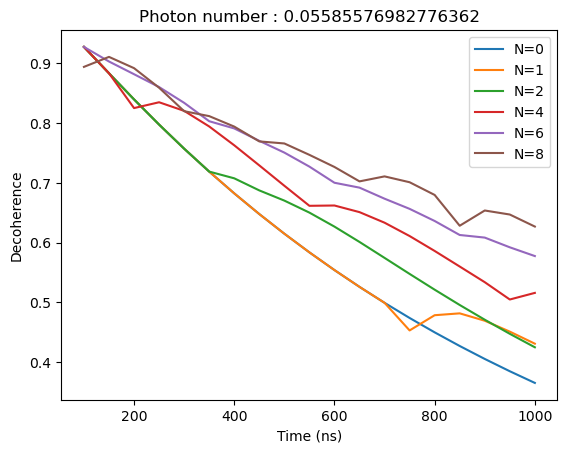

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

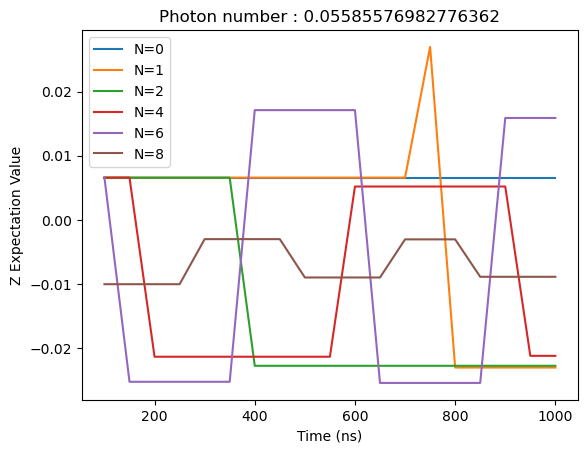

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.3

Text(0, 0.5, 'Decoherence')

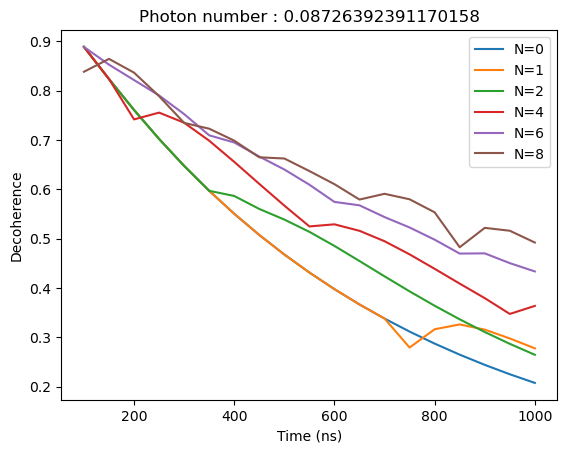

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

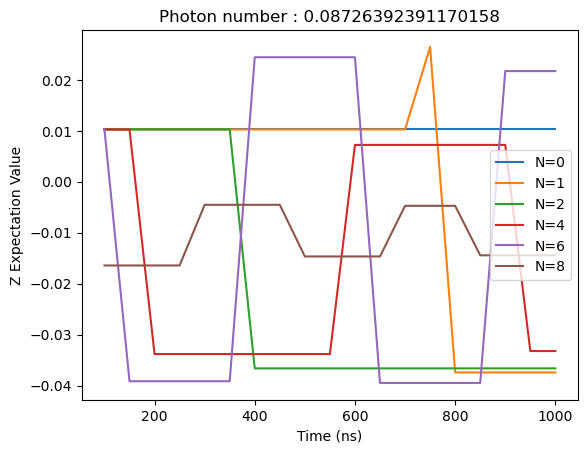

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.4

Text(0, 0.5, 'Decoherence')

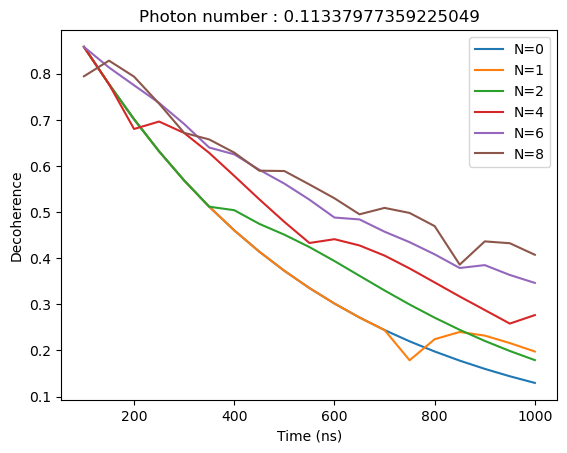

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

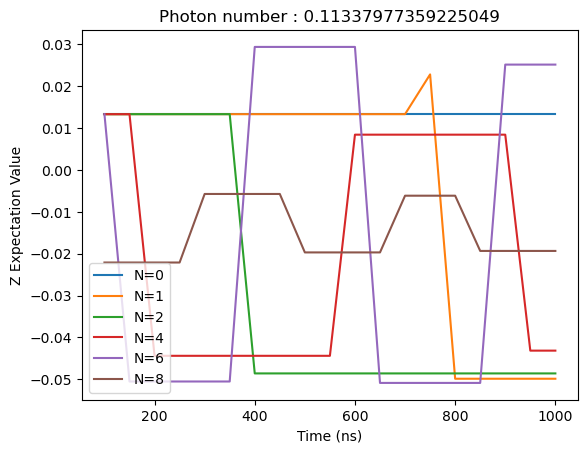

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.5

Text(0, 0.5, 'Decoherence')

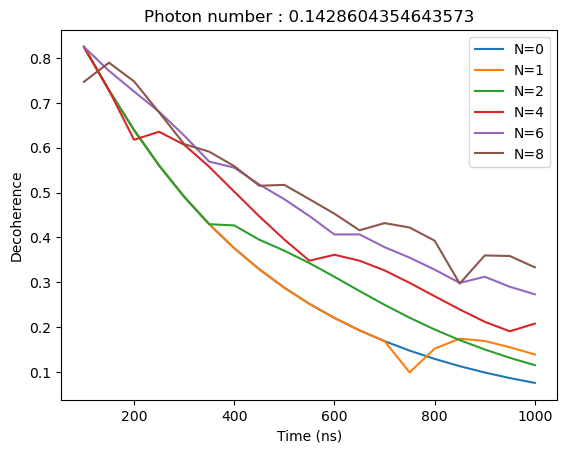

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

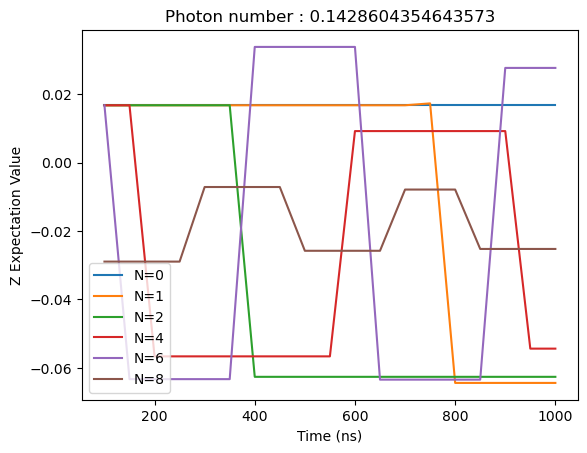

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.6

Text(0, 0.5, 'Decoherence')

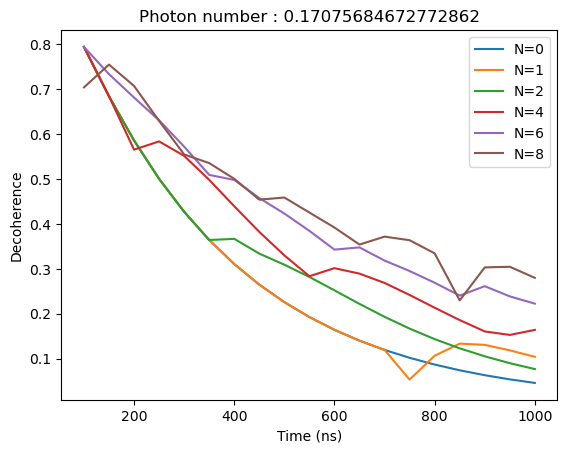

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

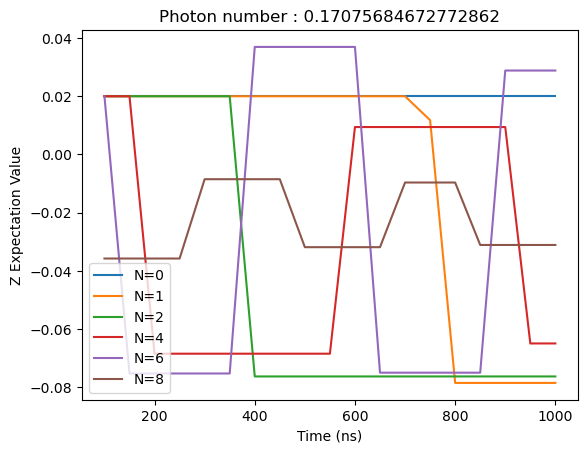

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.7

Text(0, 0.5, 'Decoherence')

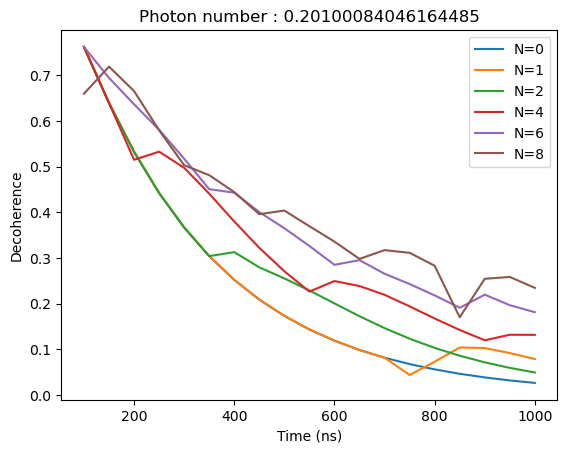

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

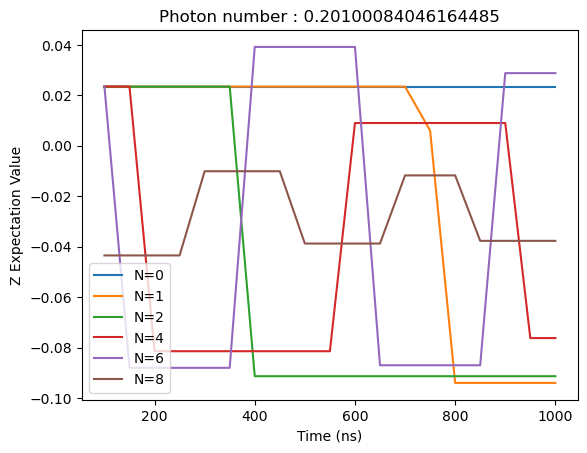

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.8

Text(0, 0.5, 'Decoherence')

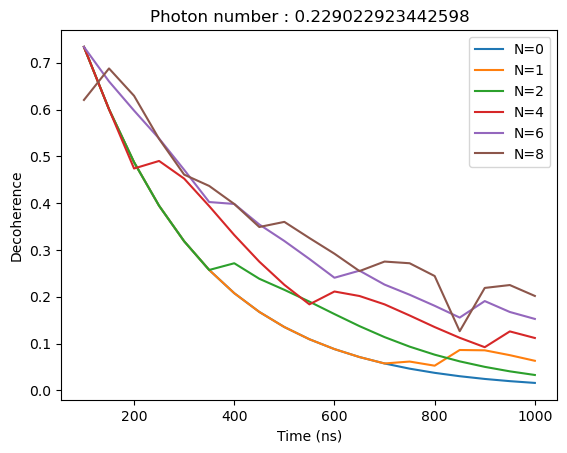

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

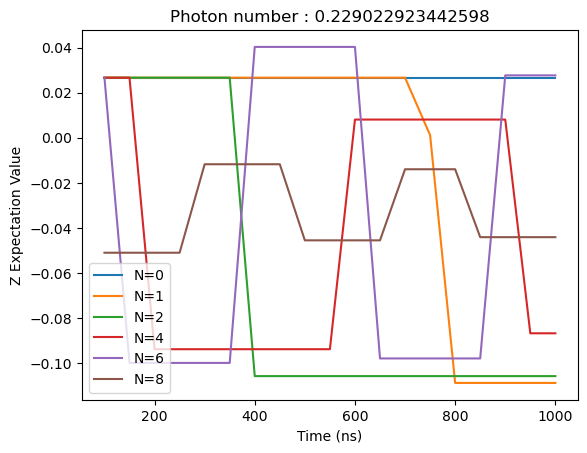

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.9

Text(0, 0.5, 'Decoherence')

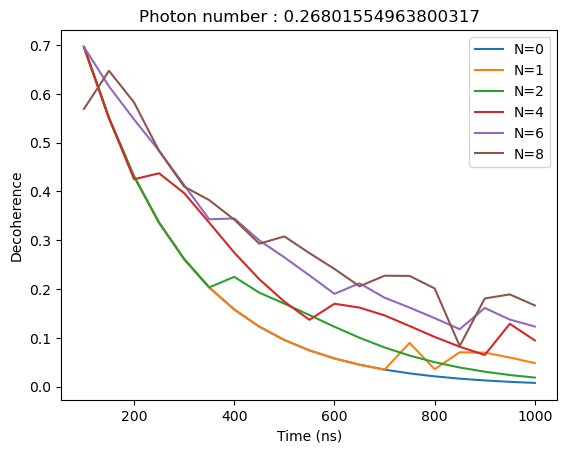

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

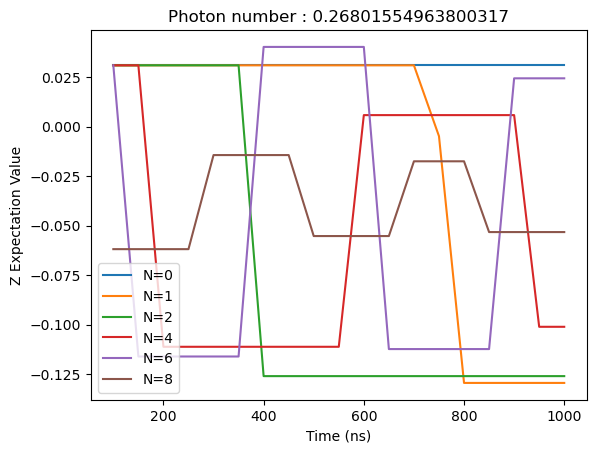

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=1.0

Text(0, 0.5, 'Decoherence')

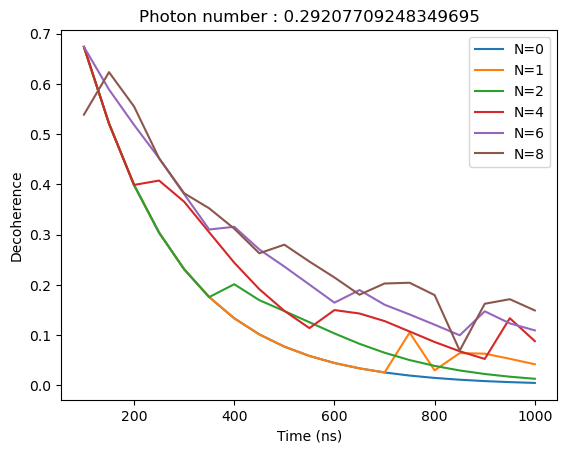

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

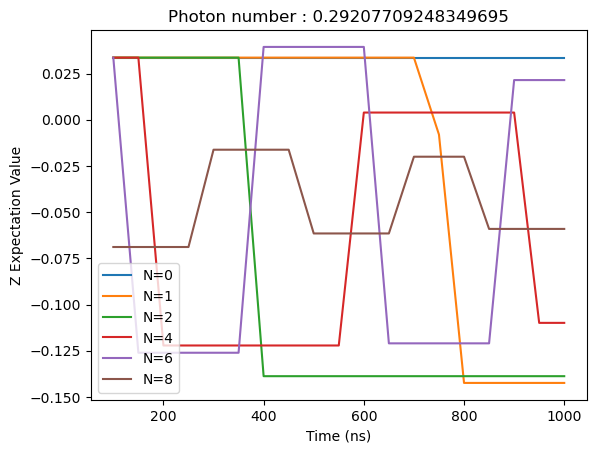

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

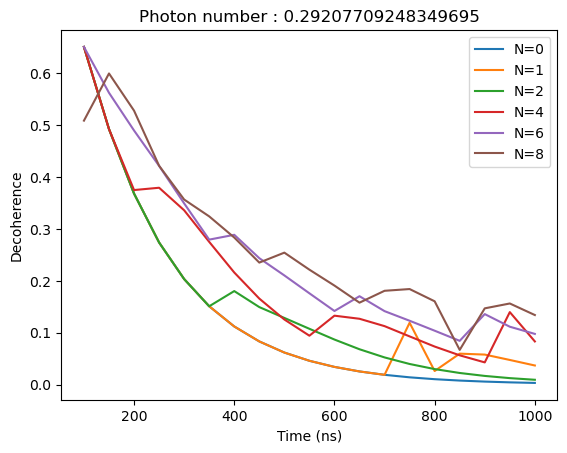

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[10][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

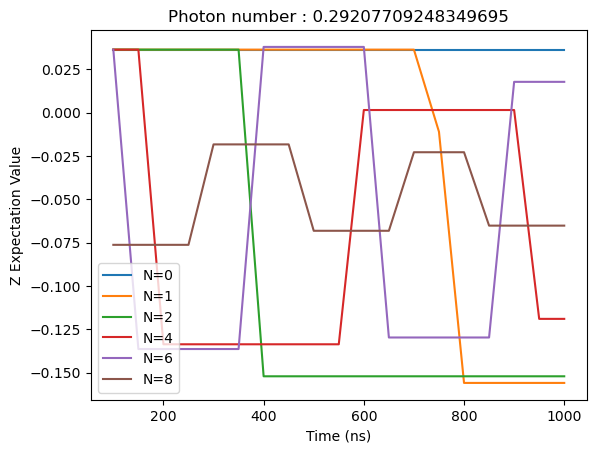

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[10][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

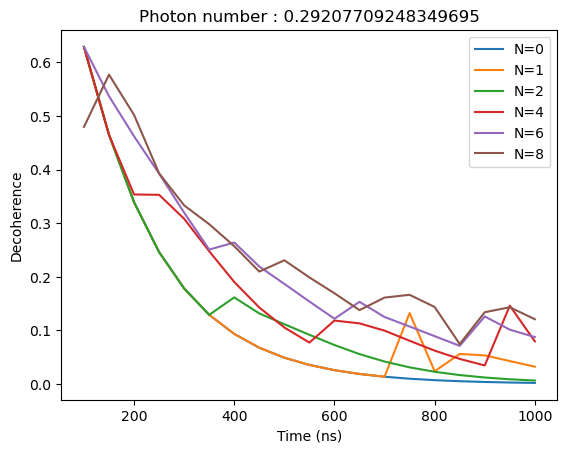

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[11][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

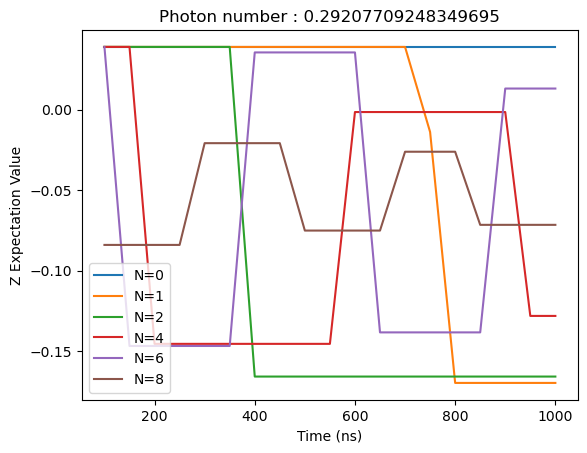

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[11][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

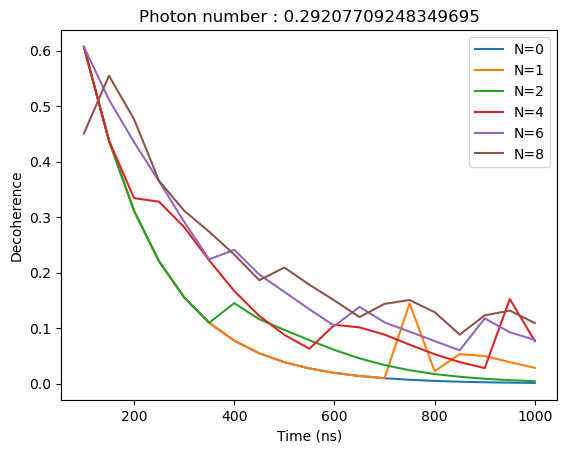

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[12][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

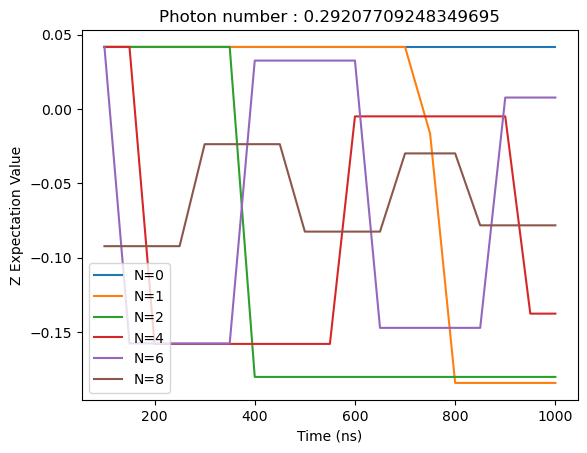

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[12][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

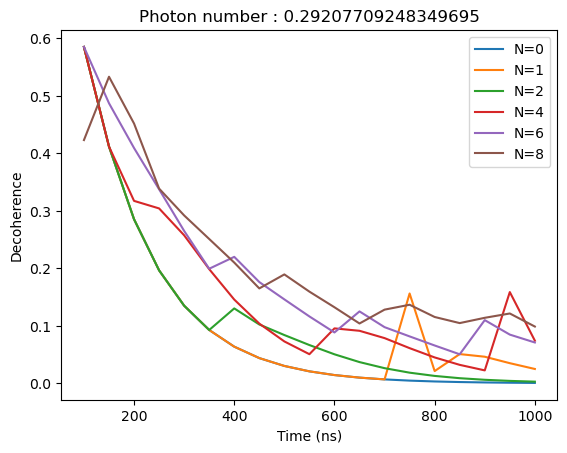

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[13][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

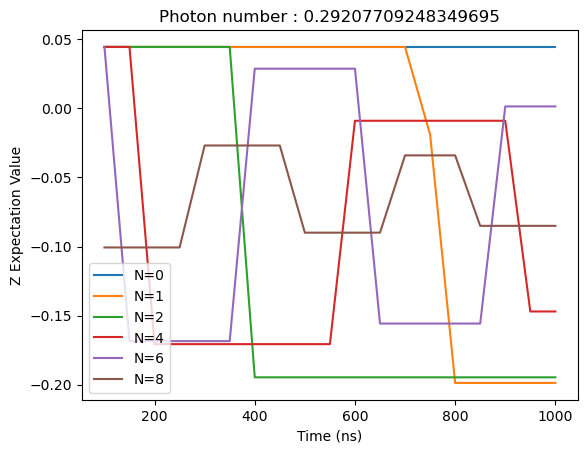

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[13][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

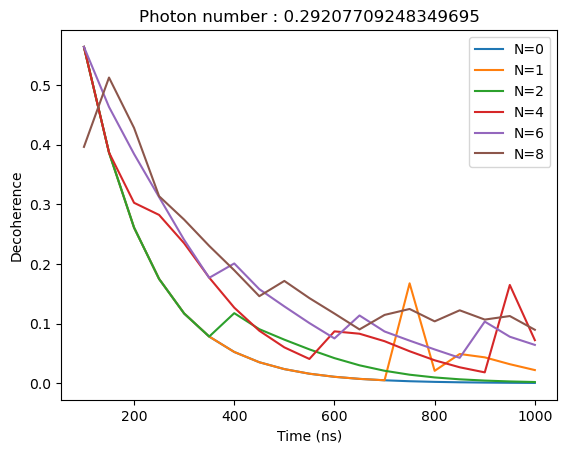

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[14][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

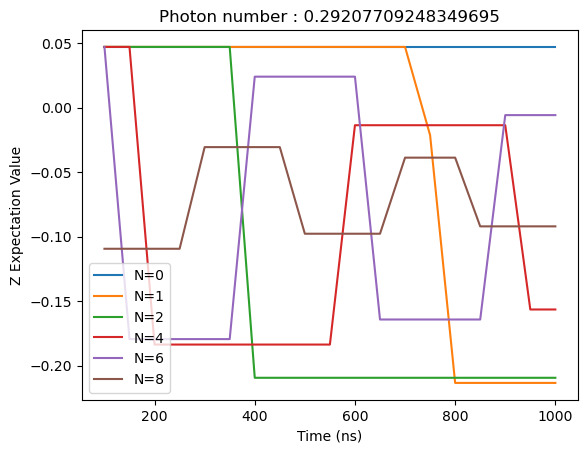

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[14][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

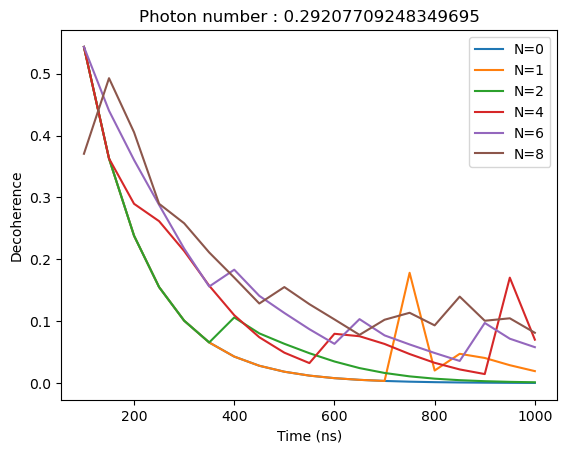

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[15][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

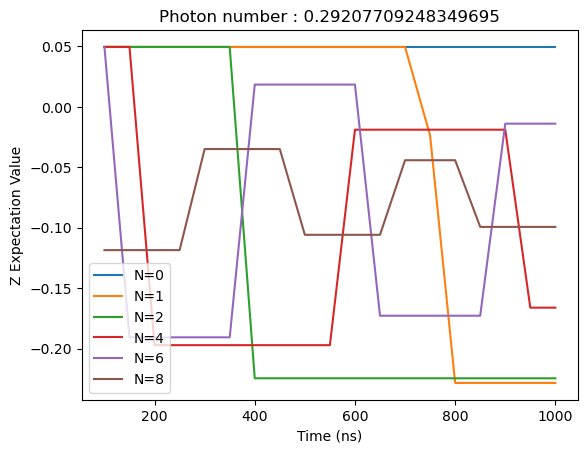

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[15][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

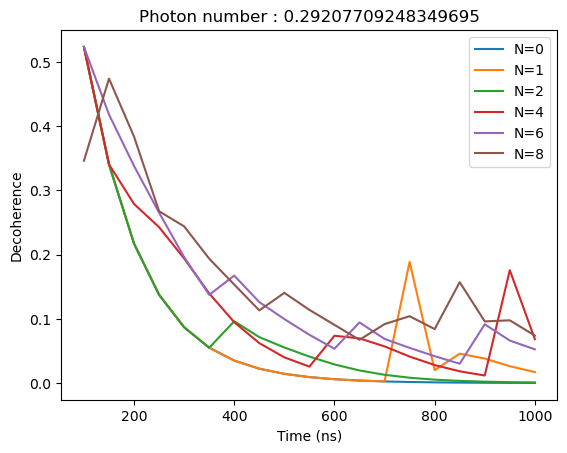

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[16][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

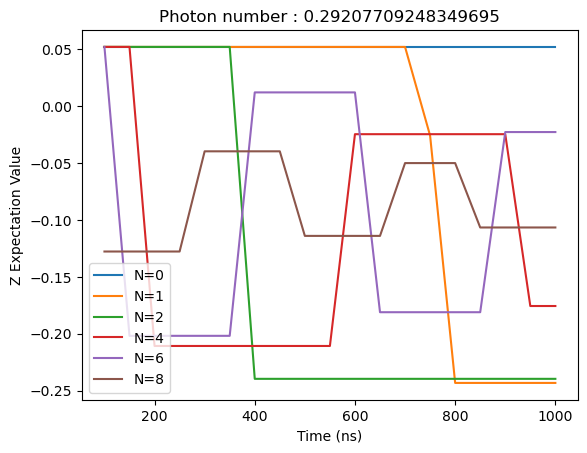

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[16][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

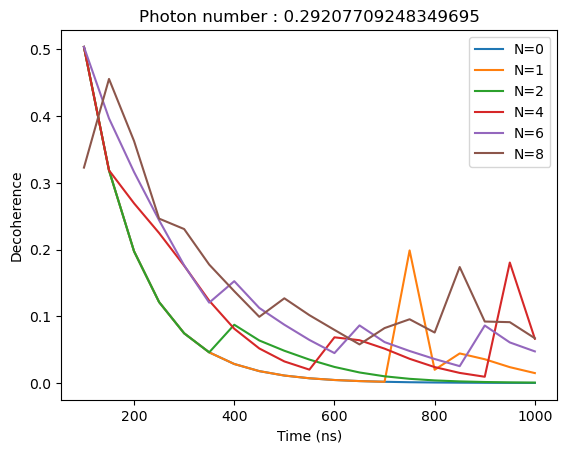

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[17][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

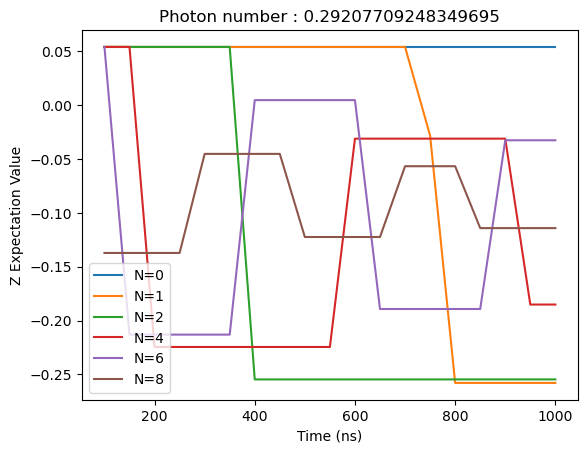

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[17][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

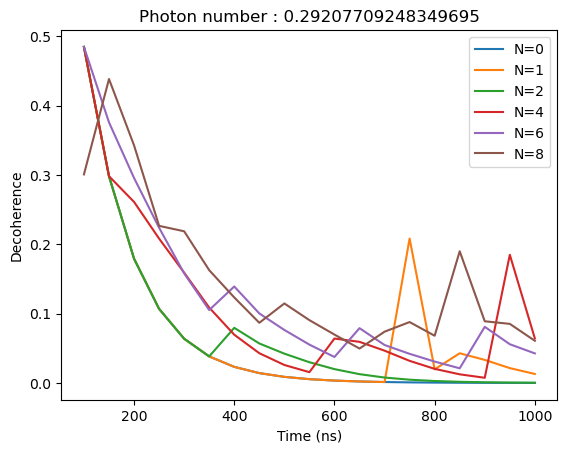

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[18][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

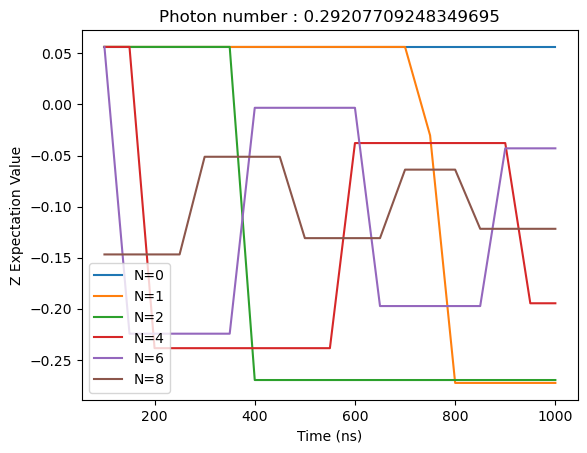

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[18][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'Decoherence')

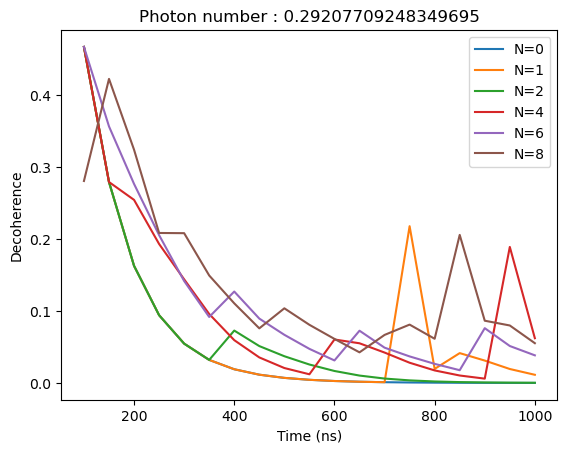

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[19][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

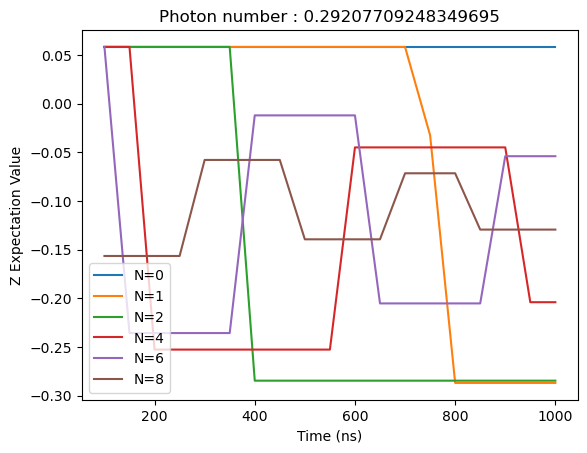

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[19][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

## 6) RD 6.9GHz, n 0.002~0.02



B=0.05GHz

Resonator Dissipation Rate : $\kappa = 2π · 0.01$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A = [0.06875/7, 0.1/7, 0.125/7, 0.1425/7, 0.16/7, 0.175/7, 0.19/7, 0.203/7, 0.22/7, 0.23/7]

n_exp =     [0.0024784447878800154,
0.00524365178153382,
0.008193205899811257,
0.010647890361951226,
0.013423748439155747,
0.016058683280566387,
0.018929582246700348,
0.02160856330132745,
0.025379271671985934,
0.027738913335158814]

alpha_exp = [(-0.04947320720465466-0.0025235074203868828j),
(-0.07196102864723897-0.0036705562470737622j),
(-0.08995128571762373-0.004588195303894185j),
(-0.10254446548713506-0.005230542633940789j),
(-0.11513764485273735-0.005872889942130782j),
(-0.12593179791231238-0.00642347331222661j),
(-0.1367259497684359-0.00697405661720559j),
(-0.14608087970890682-0.007451228724595777j),
(-0.1583142456728296-0.008075222804723267j),
(-0.16551034007495222-0.008442277971570464j)]

N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.9 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

In [ ]:
# iterate for photon number n
for i in range(10):

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, alpha_exp[i]))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = (omega_r-omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': 0, 'T_end': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9


Text(0, 0.5, 'Decoherence')

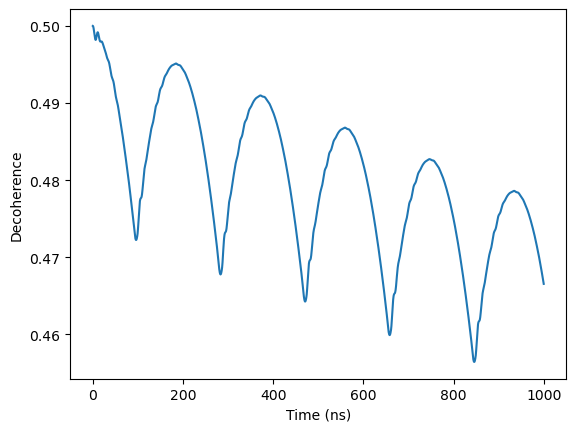

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

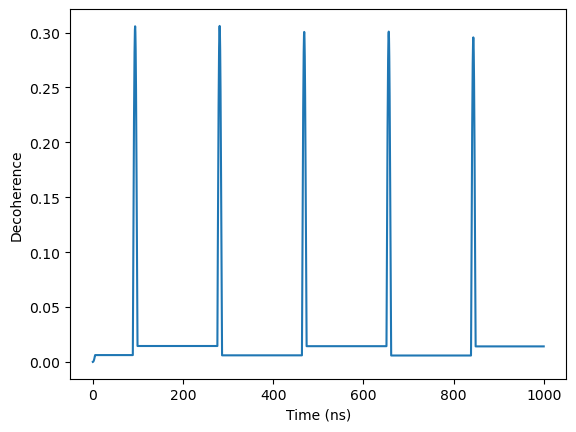

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

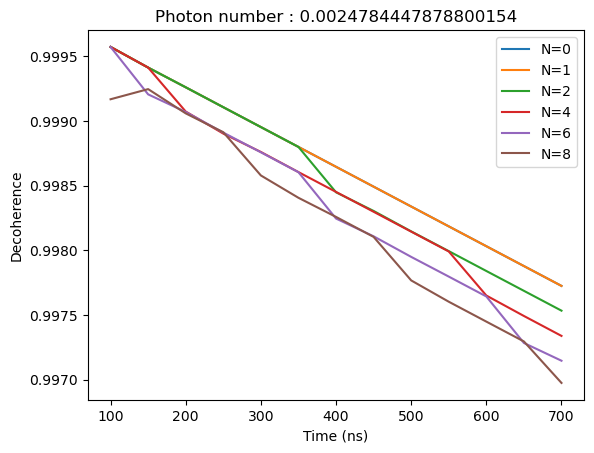

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[0][j][:13], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

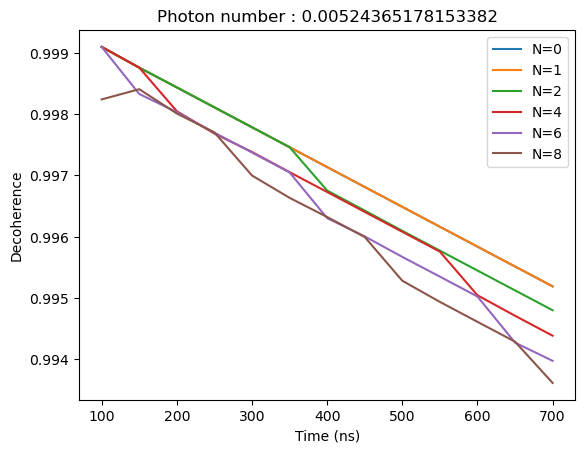

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[1][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

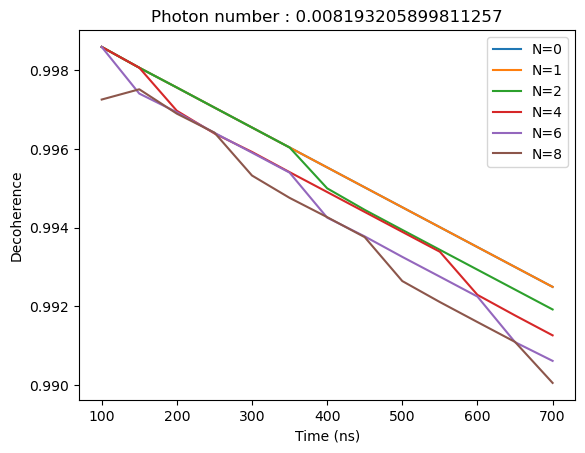

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[2][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

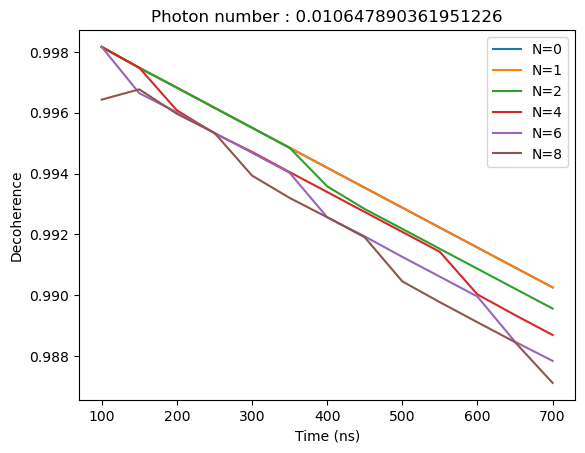

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[3][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

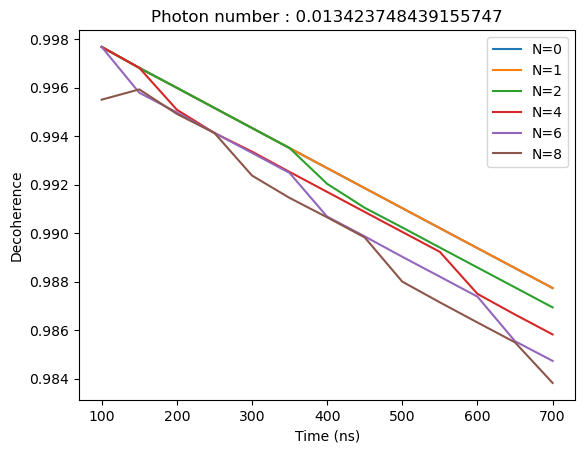

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[4][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

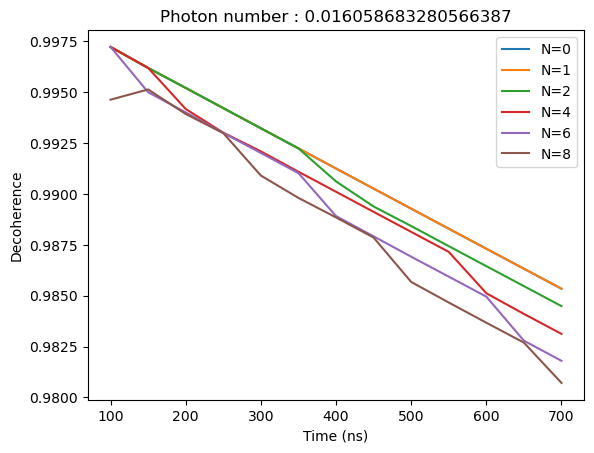

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[5][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

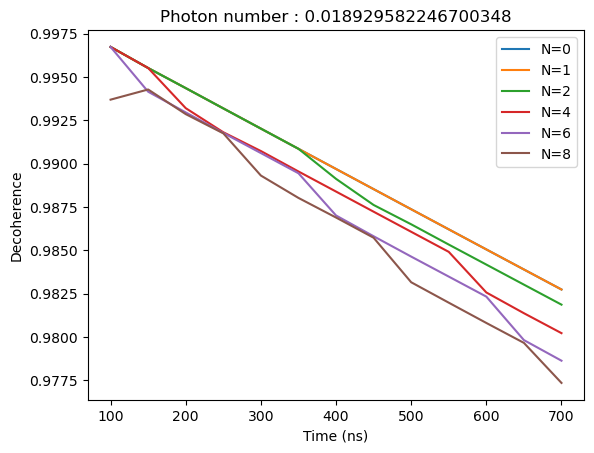

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[6][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

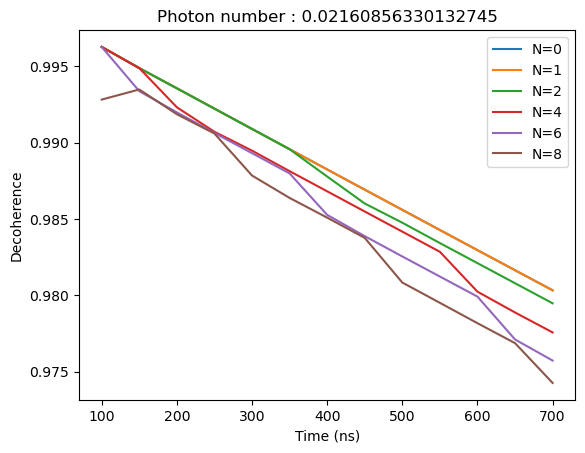

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[7][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

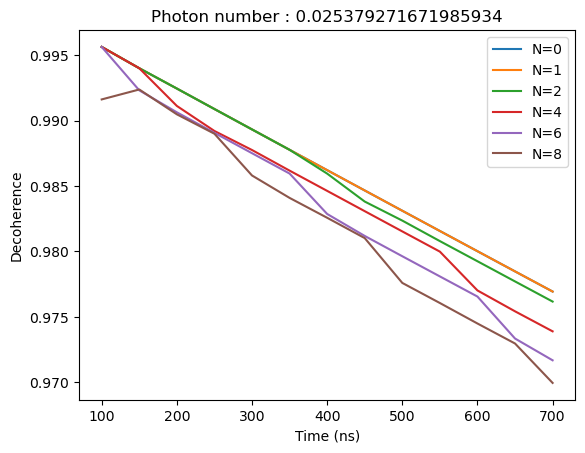

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[8][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

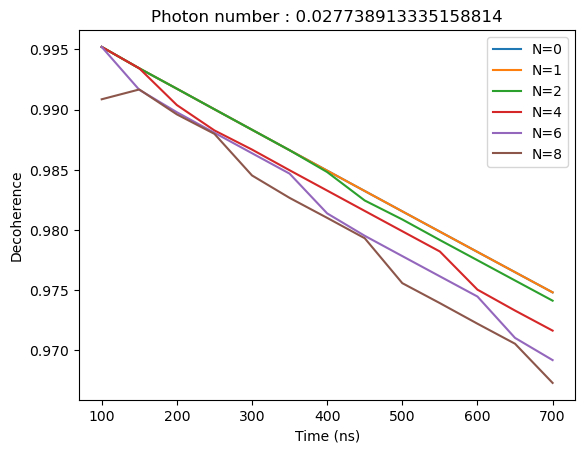

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[9][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

### 7) RD 6.9GHz, n 0.02~0.2



B=0.05GHz

Resonator Dissipation Rate : $\kappa = 2π · 0.01$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :

In [ ]:
A = [0.06875, 0.1, 0.125, 0.1425, 0.16, 0.175, 0.19, 0.203, 0.22, 0.23]

N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.9 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

In [ ]:
# iterate for photon number n
for i in range(10):

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, 0))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = (omega_r-omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': 0, 'T_end': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9


Text(0, 0.5, 'Decoherence')

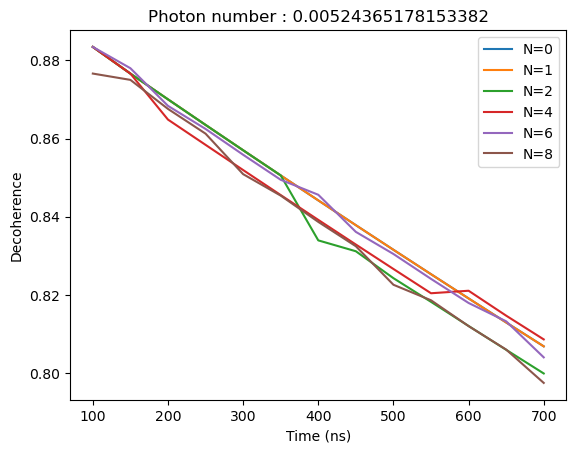

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[0][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

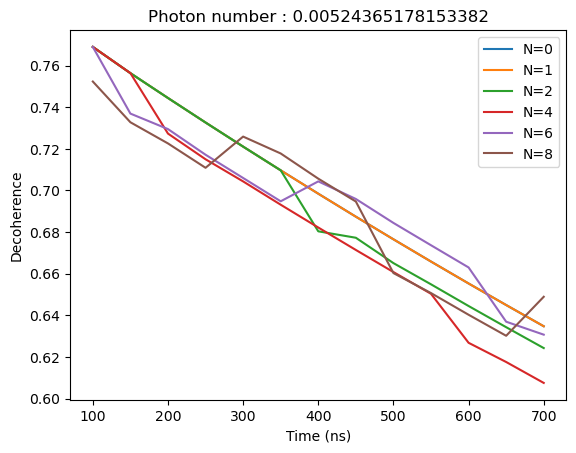

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[1][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

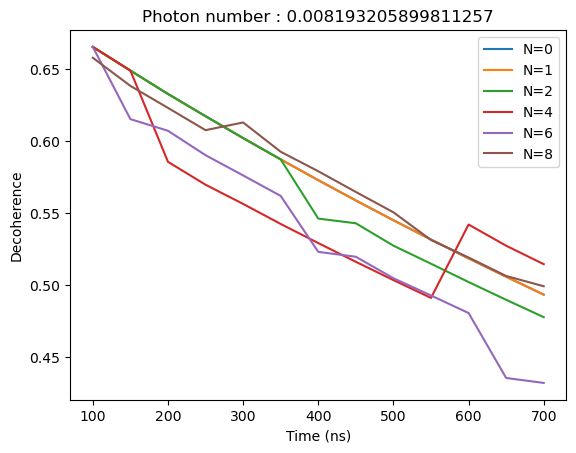

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[2][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

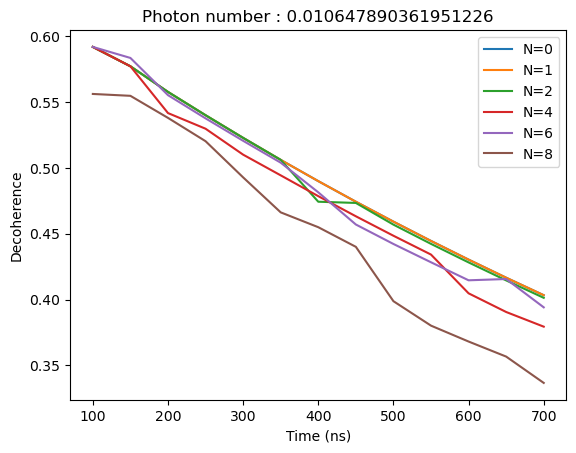

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[3][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

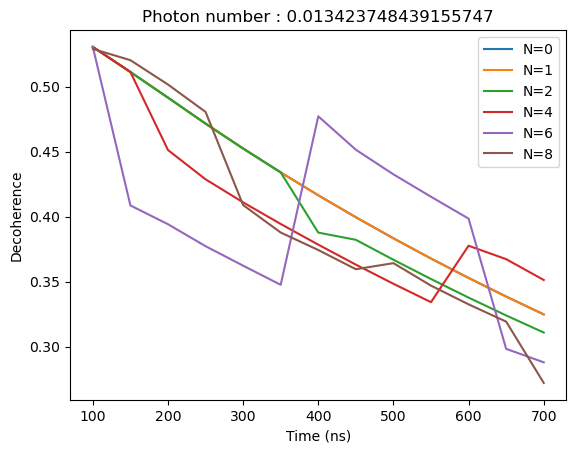

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[4][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

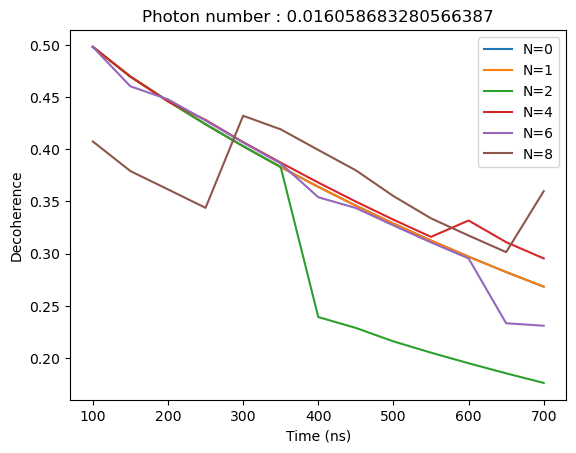

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[5][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

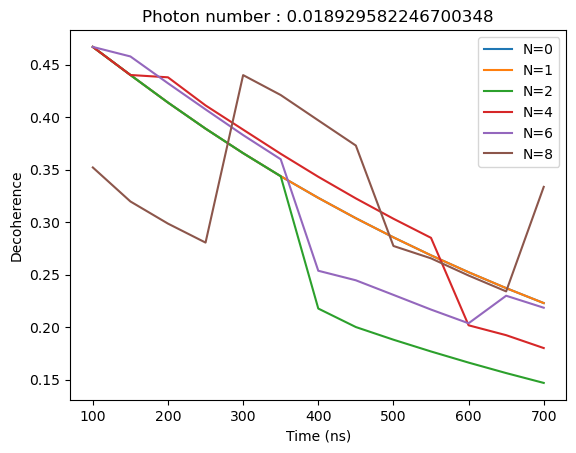

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[6][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

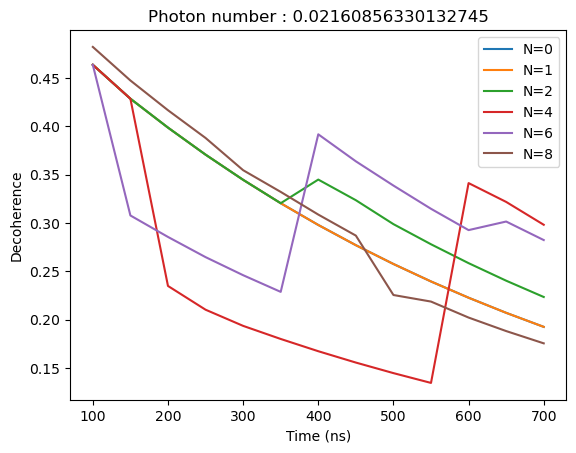

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[7][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

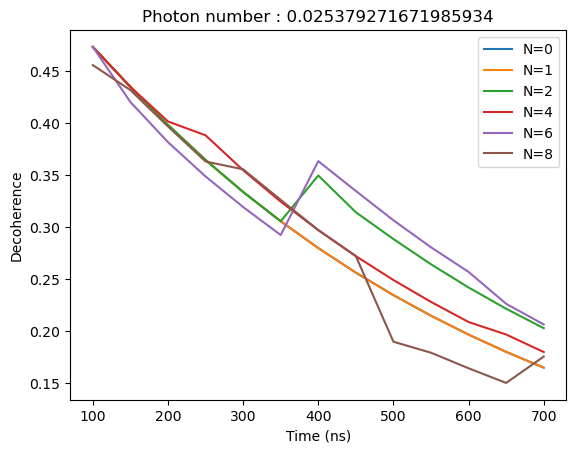

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[8][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list[:13], plus_tot[9][j][:13], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')